# Model analysis v5-BAFigs-holdconstant (priorwettingonly)

March 1, 2023. Updated February 10, 2025.

Caroline Juang, c.juang@columbia.edu

**`holdconstant`**: The same exact figures and analysis as `Model_analysisv5-BAFigs`, but performed by modifying `Model_Akaike` and `Model_Akaike_CrossValid` with a specific experiment (bolded):
* 1: warming variables only
    * forest: hold all but non-Tmax and non-VPD variables constant.
    * non-forest: hold all but non-Tmax, non-VPD, and non-current year prec constant.
* **2: prior wetting vars only**
    * forest and non-forest: hold all non- prior year prec constant.
* 3: y-0 wetting variables only
    * forest and non-forest: hold all but non-current year prec constant.

In [1]:
# import
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy.stats import pearsonr
from scipy.stats.mstats import theilslopes
import scipy
import joblib
import datetime
from itertools import compress

# formatting shapefiles
from matplotlib.patches import Rectangle
from shapely.geometry import Polygon
from shapely.geometry import JOIN_STYLE
from shapely.ops import unary_union


# mapping
import geopandas as gpd
import cartopy.crs as ccrs
from cartopy.feature import NaturalEarthFeature, OCEAN, LAND, COASTLINE
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

# set figures formatting
import matplotlib
import matplotlib.colors as mcolors
from matplotlib import rc
import matplotlib.gridspec as gridspec
from matplotlib.colorbar import Colorbar
from matplotlib.ticker import FuncFormatter
import colorcet # more colormaps

import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('retina')
plt.rcParams['figure.dpi'] = 200

In [2]:
# suppress deprecation warnings (temporarily using this bc matplotlib warnings)
import warnings
def fxn():
    warnings.warn("deprecated", DeprecationWarning)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fxn()

In [3]:
### manual variables to change

# importing data string
directory = 'your_data_directory' # customize here
# Read the climate index from the .txt file
with open('0_climindname.txt', 'r') as f:
    climindnameObs = f.read().strip()
print(climindnameObs +' will be used for the SST gradient')
climindnameDT = 'DeTrend_'+climindnameObs
climfilename = 'DeTrendClimObs_'+climindnameObs # same as Model_ENSOfull
#data_string = 'data\\'
data_string = 'data//'
#model_string = 'model\\'+climindnameObs+'\\'
model_string = 'model//'+climindnameObs+'//'
#predict_string = 'predicted\\'+climindnameObs+'\\'
predict_string = 'predicted//'+climindnameObs+'//'

# folder for saving figures
figfolder = 'your_figures_folder' # customize here

# ecoregion info
prov_abbr_names = ['1: American Semi-Desert',
                  '2: AZ-NM Mountains',
                  '3: Black Hills Conifer Forest',
                  '4: CA Coast Chapparral Forest',
                  '5: CA Coast Range Open Woodland',
                  '6: CA Coast Steppe',
                  '7: CA Dry Steppe Province',
                  '8: Cascade Mixed Forest',
                  '9: Chihuahuan Semi-Desert',
                  '10: CO Plateau',
                  '12: Great Plains',
                  '13: IM Semi-Desert',
                  '14: IM Semi-Desert and Desert',
                  '15: Middle Rocky Mountain Steppe',
                  '16: NV-UT Mountains',
                  '17: Northern Rocky Mountain Forest',
                  '18: Pacific Lowland Mixed Forest',
                  '19: Sierran Steppe',
                  '20: Southern Rocky Mountain Steppe',
                  '21: SW Plateau and Plains']
# ecoregion names removing the ones we don't care about
# this is the label printed on everything
prov_label_names = ['1: American Semi-Desert',
                  '2: AZ-NM Mountains',
                  '3: CA Coast Chapparral Forest',
                  '4: CA Coast Range Open Woodland',
                  '5: CA Dry Steppe Province',
                  '6: Cascade Mixed Forest',
                  '7: Chihuahuan Semi-Desert',
                  '8: CO Plateau',
                  '9: Great Plains',
                  '10: IM Semi-Desert',
                  '11: IM Semi-Desert and Desert',
                  '12: Middle Rocky Mountain Steppe',
                  '13: NV-UT Mountains',
                  '14: Northern Rocky Mountain Forest',
                  '15: Sierran Steppe',
                  '16: Southern Rocky Mountain Steppe',
                  '17: SW Plateau and Plains']

# long-form names
province_names = ['American Semi-Desert and Desert Province',
                  'Arizona-New Mexico Mountains Semi-Desert-Open Woodland-Coniferous Forest-Alpine Meadow Province',
                  'Black Hills Coniferous Forest Province',
                  'California Coastal Chapparral Forest and Shrub Province',
                  'California Coastal Range Open Woodland-Shrub-Coniferous Forest-Meadow Province',
                  'California Coastal Steppe-Mixed Forest-Redwood Forest Province',
                  'California Dry Steppe Province',
                  'Cascade Mixed Forest-Coniferous Forest-Alpine Meadow Province',
                  'Chihuahuan Semi-Desert Province',
                  'Colorado Plateau Semi-Desert Province',
                  'Great Plains-Palouse Dry Steppe Province',
                  'Intermountain Semi-Desert Province',
                  'Intermountain Semi-Desert and Desert Province',
                  'Middle Rocky Mountain Steppe-Coniferous Forest-Alpine Meadow Province',
                  'Nevada-Utah Mountains-Semi-Desert-Coniferous Forest-Alpine Meadow Province',
                  'Northern Rocky Mountain Forest-Steppe-Coniferous Forest-Alpine Meadow Province',
                  'Pacific Lowland Mixed Forest Province',
                  'Sierran Steppe-Mixed Forest-Coniferous Forest-Alpine Meadow Province',
                  'Southern Rocky Mountain Steppe-Open Woodland-Coniferous Forest-Alpine Meadow Province',
                  'Southwest Plateau and Plains Dry Steppe and Shrub Province']


dfnum = [item for item in range(1,len(province_names)+1+1)]
dfnum.remove(11) # remove empty ecoregion - no overlap btwn westUS map and ecoregion
dfnum = np.array(dfnum)

dfnames = ['allwestUS', 'ecoprov1', 'ecoprov2', 'ecoprov3', 'ecoprov4', 'ecoprov5', 
           'ecoprov6', 'ecoprov7', 'ecoprov8', 'ecoprov9', 'ecoprov10', 
           'ecoprov12','ecoprov13','ecoprov14','ecoprov15',
           'ecoprov16','ecoprov17','ecoprov18','ecoprov19','ecoprov20','ecoprov21']

# data manipulation
firstyear = 1984
finalyear = 2022
years = np.arange(firstyear, finalyear+1)
# translate years into dates
firsttime = str(firstyear)+'-01-01'
finaltime = str(finalyear)+'-12-31'

# color palette for SST gradient
#colorobs = '#E2725B' # a warm red to denote warming
colorobs = '#fc8d62' # light orange, from colorbrewer2
#colorDT = '#9BC6F0' # blue color for neutral cool
#colorDT = '#3366CC' # darker blue color?
colorDT = '#8da0cb' # periwinkle blue, from colorbrewer2

patch125-155_nino3-34 will be used for the SST gradient


In [4]:
# skip analysis for these ecoprovinces for low fire occurrence
# create filter for westUS + ecoprovs
df_filter = np.ones(len(dfnames))
dfnames_filter = ['ecoprov3', 'ecoprov6', 'ecoprov18']
for thisname in dfnames_filter:
    df_filter[dfnames.index(thisname)] = 0 # filter out this ecoregion
# filter arrays
dfnames = list(compress(dfnames, df_filter))

# create filter for ecoprovs
df_filternum = np.ones(len(dfnum))
dfnum_filter = np.array([3,6,18])
for thisnum in dfnum_filter:
    df_filternum[dfnum==thisnum] = 0 # filter out this ecoregion
# filter arrays
province_names = list(compress(province_names, df_filternum))
prov_abbr_names = list(compress(prov_abbr_names, df_filternum))
dfnum = np.array(list(compress(dfnum, df_filternum)))

# scripts

In [5]:
def in_forest(variable, thisregion):
    """
    For getting the average values only in a forest area.
    Requirements: the forest netCDF.
    Returns one weighted average of the variable for each timestep.
    """
    forestregion = forest*thisregion # get in the region
    weightedsum = (variable*(forestregion)).sum(dim=['X','Y'], skipna=True)
    forestsum = (forestregion).sum()
    return  weightedsum / forestsum


def in_nonforest(variable, thisregion):
    """
    For getting the average values only in a nonforested area in the western US.
    Requirements: the forest netCDF, a mask of the western US.
    Returns one weighted average of the variable for each timestep and the selected region.
    """
    nonforestregion = nonforest*thisregion # get in the region
    weightedsum = (variable*(nonforestregion)).sum(dim=['X','Y'], skipna=True)
    nonforestsum = (nonforestregion).sum()
    return  weightedsum / nonforestsum

In [6]:
# average climate variables, within a selected season

def annual_seasonAvg(data, firstmonth, finalmonth):
    """
    This intakes an array of current ecoregion's climate variable of monthly averages (data), 
    Output: an array of yearly averages of the ecoregion climate variable, in the
    seasons specified (firstmonth, finalmonth).
    Requirements: time = an xarray timeseries of months in datetime format.
    """
    withinyear = (time['time.year']>= years[0]) & (time['time.year'] <= years[-1])
    withinseason = (time['time.month'] >= firstmonth) & (time['time.month'] <= finalmonth)
    thistime = time[withinseason & withinyear] # cut time

    # create pd dataframe based on data, for time resampling
    thisdf = pd.DataFrame({'time': pd.to_datetime(thistime.values), 'clim':data[withinyear & withinseason]}).set_index('time')
    thisdf = thisdf.resample('Y').mean().reset_index()
    return thisdf.clim.values

# Import data
from `data\Data_CreateModelData`

## for SST gradient, on map and then annual data
* `sstannual` is xarray gridded data of X,Y,and time=yearly SST globally
* `sstmonthly_df` is pandas dataframe of the SST gradient (west minus east) in degrees C on monthly scale
* `sstmonthly_DT_df` is pandas dataframe of the SST gradient, monthly scale, but detrended (zero slope)

In [7]:
# for getting annual trend of SST data
# import sst data
firstssttime = str((firstyear-2))+'-01-01'
sst = xr.open_dataset(directory + 'NOAA_SST//sst.mnmean.nc', engine='netcdf4')
sst = sst.sst.loc[firstssttime:finaltime]

# sample by year
sstannual = sst.resample(time='Y').mean()
del sst # free up space

In [8]:
# IMPORT SST GRADIENTS
# import observed SST gradient monthly, 1992-present
filename = data_string + 'gradient_'+climindnameObs+'.txt'
sstmonthly = pd.read_csv(filename).set_index('Unnamed: 0')
# import detrended SST gradient monthly
#filename = 'data\\gradient_'+climindnameDT+'.txt'
filename = data_string + 'gradient_'+climindnameDT+'.txt'
sstmonthly_DT = pd.read_csv(filename).set_index('Unnamed: 0')

# crop files
sstmonthly = sstmonthly.loc[firstyear-2:finalyear]
sstmonthly_DT = sstmonthly_DT.loc[firstyear-2:finalyear]
ssttime = pd.to_datetime(pd.date_range(start=str(sstmonthly.index[0])+'-01-01', end=finaltime, freq='M'), unit='M')

# create pd dataframe
sstmonthly_df = pd.DataFrame(data={'time': ssttime, 'anomaly': sstmonthly.to_numpy().flatten()}).set_index('time')
sstmonthly_DT_df = pd.DataFrame(data={'time': ssttime, 'anomaly': sstmonthly_DT.to_numpy().flatten()}).set_index('time')

## for Ecoprovince map

* `Becoprov` to plot shapefiles of Bailey's Ecoprovinces on a map so they can be colored according to data.
    * The CRS used is defined within the shapefile, so **no need to call `transform` when plotting**
* `ecoreg` to plot xarray-based gridded data of Bailey's ecoprovinces on a figure.
    * Use CRS `ccrs.PlateCarree()` when plotting

In [9]:
# import Bailey's Ecoregions
#Bailey_string = '1km\\landcover\\ecoregions\\shapefiles\\bailey\\eco-us-shp-GCS\\eco-us-shp-GCS.shp'
Bailey_string = '1km//landcover//ecoregions//shapefiles//bailey//eco-us-shp-GCS//eco-us-shp-GCS.shp'
Becoreg = gpd.read_file(directory + Bailey_string)

# projection info from file
Bailey_crs = Becoreg.crs
# projection info from website
#EPA_crs2 = ccrs.LambertAzimuthalEqualArea(central_longitude=-100, central_latitude=45, 
#                                         false_easting=0.0, false_northing=0.0, globe=None)

# get shapefile of just western US from US Census Bureau
# for some reason it includes Hawaii and Alaska
#Census_string = directory + 'Census Bureau\\Cartographic Boundary Files_Regions\\cb_2018_us_region_500k.shp'
Census_string = 'Census Bureau//Cartographic Boundary Files_Regions//cb_2018_us_region_500k.shp'
wUSregion = gpd.read_file(directory + Census_string)
wUSregion = wUSregion[wUSregion.NAME=='West']
# remove HI and AK
extentpoly = Polygon([(-130,30), (-130,50), (-100,50),(-100,30)])
poly_gdf = gpd.GeoDataFrame(geometry=[extentpoly], crs=ccrs.PlateCarree())
wUSregion = wUSregion.clip(extentpoly)

wUSregion = wUSregion.to_crs(Bailey_crs) # transform projection

# clip the ecoregions to just western US
Becoreg = gpd.clip(Becoreg, wUSregion)
# sort to the same order as data
Becoreg = Becoreg.set_index('PROVINCE')
Becoreg = Becoreg.loc[province_names]

# iterate through ecoregions and merge into ecoprovinces
# group the data by ecoregion
Becoprov = gpd.GeoDataFrame(columns=['PROVINCE','NUMBER','geometry'], geometry='geometry')
gbecoreg = Becoreg.groupby('PROVINCE')
i = 0 # start counter
eps = 0.001 # define buffer
# iterate through each province and MERGE the ecoregions
for thisname, thisgroup in gbecoreg:
    thisgeometry = thisgroup.geometry.to_crs('epsg:5070') # set CRS with m as unit
    thisgeometry = thisgeometry.buffer(eps, 1, join_style=JOIN_STYLE.mitre) # add buffer
    thisgeometry = unary_union(thisgeometry).buffer(-eps, 1, join_style=JOIN_STYLE.mitre) # merge, then remove buffer
    thisgeometry = gpd.GeoSeries(thisgeometry).set_crs('epsg:5070').to_crs('epsg:4326') # set CRS with degrees
    #thisgeometry = gpd.GeoSeries(unary_union(thisgroup.geometry))
    thisprovince = gpd.GeoDataFrame(data={'PROVINCE': thisname, 
                                          'NUMBER': dfnum[i], 
                                          'geometry': thisgeometry}, geometry='geometry')
    # append to create ecoprovince geodataframe
    Becoprov = gpd.GeoDataFrame(pd.concat([Becoprov, thisprovince], ignore_index=True))
    i+=1

# Becoprov is now a geodataframe I can use, with SHAPEFILES of provinces.

## import ecoprovinces xarray (gridded version)

In [10]:
#ecoreg_string = directory + '12km\\landcover\\Ecoregions_EPA\\bailey_ecoprovince.nc'
ecoreg_string = directory + '12km//landcover//Ecoregions_EPA//bailey_ecoprovince.nc'
ecoreg = xr.open_dataset(ecoreg_string, engine='netcdf4')
print(ecoreg.bailey_ecoprovince.province.legend)
ecoreg = ecoreg.bailey_ecoprovince

# add in entire western US
#ecoreg = xr.concat([westUS, ecoreg.bailey_ecoprovince], dim='province')
# remove the ecoregion that does not overlap with the western US
ecoreg = ecoreg.sel(province=dfnum)

1: American Semi-Desert and Desert Province, 2: Arizona-New Mexico Mountains Semi-Desert-Open Woodland-Coniferous Forest-Alpine Meadow Province, 3: Black Hills Coniferous Forest Province, 4: California Coastal Chapparral Forest and Shrub Province, 5: California Coastal Range Open Woodland-Shrub-Coniferous Forest-Meadow Province, 6: California Coastal Steppe-Mixed Forest-Redwood Forest Province, 7: California Dry Steppe Province, 8: Cascade Mixed Forest-Coniferous Forest-Alpine Meadow Province, 9: Chihuahuan Semi-Desert Province, 10: Colorado Plateau Semi-Desert Province, 11: Great Plains Steppe Province, 12: Great Plains-Palouse Dry Steppe Province, 13: Intermountain Semi-Desert Province, 14: Intermountain Semi-Desert and Desert Province, 15: Middle Rocky Mountain Steppe-Coniferous Forest-Alpine Meadow Province, 16: Nevada-Utah Mountains-Semi-Desert-Coniferous Forest-Alpine Meadow Province, 17: Northern Rocky Mountain Forest-Steppe-Coniferous Forest-Alpine Meadow Province, 18: Pacific 

## import forest and nonforest area
* `westUS` is xarray-based gridded data of the western US region.
* `forest` is xarray-based forest gridded data, within western US.
* `nonforest` is xarray-based nonforest gridded data within western US.
* `ecoreg` is xarray-based ecoprovinces
* `ecoregfor` is xarray-based ecoprovinces, forest area only
* `ecoregnon` is xarray-based ecoprovinces, nonforest area only

In [11]:
# import western US study area
#westUS_string = directory + '12km\\study_area\\westUS.nc'
westUS_string = directory + '12km//study_area//westUS.nc'
westUS = xr.open_dataset(westUS_string, engine='netcdf4')
westUS = westUS.westUS

# import forest
#forest_string = directory + '12km\\landcover\\US_ForestType_Ruefenacht\\forest_type_frac.nc'
forest_string = directory + '12km//landcover//US_ForestType_Ruefenacht//forest_type_frac.nc'
forest = xr.open_dataset(forest_string, engine='netcdf4')
forest = forest.forest_type_frac.sum(dim='ftype') # sum over all forest types

# create forest and nonforest area 
forest = westUS*forest
nonforest = westUS*(1-forest)
# add province as dimension to the westUS, to combine with ecoregions
westUS = westUS.expand_dims({'province':[0]})

In [12]:
# divide forest and nonforest into ecoprovinces

ecoregfor = [] # storage
ecoregnon = []

# get forest and nonforest pixels only where greater than .5
for thisregnum in dfnum:
    tmpfor = (forest.where(forest>.50))*ecoreg.sel(province=thisregnum)
    tmpnon = (nonforest.where(nonforest>.50))*ecoreg.sel(province=thisregnum)
    ecoregfor.append(tmpfor.to_numpy())
    ecoregnon.append(tmpnon.to_numpy())

# create xarray out of the data
ecoregfor = xr.DataArray(ecoregfor, coords={'province':ecoreg.province,
                                'Y':forest.Y, 'X':forest.X})
ecoregnon = xr.DataArray(ecoregnon, coords={'province':ecoreg.province,
                                'Y':forest.Y, 'X':forest.X})

## for Burned Area, individual fires and collective burned area

Make sure the model is trained on the updated data. Follow instructions on the README.
Make sure that `Model_ENSOfull12-2022` is updated with the burned area predictions.

Results:
* `intagency` is list of individual fire events
* `wumi` is gridded observed burn area
* `wumifor` is gridded observed forest burned area
* `wuminon` is gridded observed nonforest burned area
* `BAclimpredfor` for forest burned area from observed climate
* `BAclimprednon` for nonforest burned area from observed climate
* `BAclimpredfor_DT` for forest burned area, SST influence removed
* `BAclimprednon_DT` for nonforest burned area, SST influence removed

In [13]:
# import burned area from WUMI

# import list of individual fires (for number of fires)
#filename = directory + 'NWCG-MTBS\\west_US_fires_1984-2020_WUMI2.txt'
filename = directory + 'NWCG-MTBS//west_US_fires_1984-2020_WUMI2.txt'
intagency = pd.read_csv(filename, sep = ',', header=0)
print('fires in interagency-MTBS database: '+ str(intagency.final_year.count()))
intagency = intagency[intagency.final_year <= finalyear] # time period
intagency = intagency[intagency.final_forest_area_ha>0] # forest fires only
print('forest fires only <2020 interagency-MTBS database: '+ str(intagency.final_year.count()))

fires in interagency-MTBS database: 21693
forest fires only <2020 interagency-MTBS database: 11107


In [14]:
# import OBSERVED burned area wumi
filename = data_string + 'WUMI-ecoprovinces'
wumi = pd.read_csv(filename+'_all.txt').set_index('Unnamed: 0')
wumifor = pd.read_csv(filename+'_for.txt').set_index('Unnamed: 0')
wuminon = pd.read_csv(filename+'_non.txt').set_index('Unnamed: 0')

# import DETRENDED burned area wumi
filename = predict_string + 'BurnArea_wumiDT'
filenameend = '_'+str(firstyear)+'-'+str(finalyear)+'.txt'
wumiDT = pd.read_csv(filename+'_all_'+climfilename+filenameend).set_index('Unnamed: 0')
wumiforDT = pd.read_csv(filename+'_for_'+climfilename+filenameend).set_index('Unnamed: 0')
wuminonDT = pd.read_csv(filename+'_non_'+climfilename+filenameend).set_index('Unnamed: 0')

# PREDICTED BURNED AREA from observed SST and observed climate 
# (Model_ENSOfull12-2022 must be updated)

#filename = predict_string + 'BurnArea_'
filename = predict_string + 'BurnArea_'

# predicted burned area from observed climate
# REPLACED WITH EXPERIMENT HOLD CONSTANT
#thisexperiment = '_warmingvarsonly'
thisexperiment = '_prioryrwettingonly'
#thisexperiment = '_y0wettingonly'
#BAclimpredall = pd.read_csv(filename+'climpred_all_'+str(firstyear)+'-'+str(finalyear)+thisexperiment+'.txt').set_index('Unnamed: 0')
BAclimpredfor = pd.read_csv(filename+'climpred_for_'+str(firstyear)+'-'+str(finalyear)+thisexperiment+'.txt').set_index('Unnamed: 0')
BAclimprednon = pd.read_csv(filename+'climpred_non_'+str(firstyear)+'-'+str(finalyear)+thisexperiment+'.txt').set_index('Unnamed: 0')

# predicted burned area removing SST gradient trend
# (observed climate - climate without effect of SST trend)
#BAclimpredall_DT = pd.read_csv(filename+'sstpred_all_'+climfilename+'_'+str(firstyear)+'-'+str(finalyear)+thisexperiment+'.txt').set_index('Unnamed: 0')
BAclimpredfor_DT = pd.read_csv(filename+'sstpred_for_'+climfilename+'_'+str(firstyear)+'-'+str(finalyear)+thisexperiment+'.txt').set_index('Unnamed: 0')
BAclimprednon_DT = pd.read_csv(filename+'sstpred_non_'+climfilename+'_'+str(firstyear)+'-'+str(finalyear)+thisexperiment+'.txt').set_index('Unnamed: 0')


In [15]:
# skip analysis for these ecoprovinces for low fire occurrence
# absolutely make sure to only sum the ecoprovinces
# that matter in this study

dfnum_list = [str(x) for x in dfnum]

#wumi['0'] = wumi.loc[:,dfnum_list].sum(axis=1)
#wumifor['0'] = wumifor.loc[:,dfnum_list].sum(axis=1)
#wuminon['0'] = wuminon.loc[:,dfnum_list].sum(axis=1)

#wumiforDT['allwestUS'] = wumiforDT.loc[:,dfnames].sum(axis=1)
#wuminonDT['allwestUS'] = wuminonDT.loc[:,dfnames].sum(axis=1)

BAclimpredfor.loc[:,'allwestUS'] = np.log10((10**BAclimpredfor.loc[:,dfnames]).iloc[:,1:].sum(axis=1))
BAclimprednon.loc[:,'allwestUS'] = np.log10((10**BAclimprednon.loc[:,dfnames]).iloc[:,1:].sum(axis=1))
BAclimpredfor_DT.loc[:,'allwestUS'] = np.log10((10**BAclimpredfor_DT.loc[:,dfnames]).iloc[:,1:].sum(axis=1))
BAclimprednon_DT.loc[:,'allwestUS'] = np.log10((10**BAclimprednon_DT.loc[:,dfnames]).iloc[:,1:].sum(axis=1))

# append '0' allwestUS to the dfnum_list
dfnum_list = ['0']+dfnum_list

In [16]:
# import
import matplotlib.patheffects as pe
from matplotlib.patches import Patch

# Burned Area Timeseries (for observed and model), Figure 2(c,d,e)

##### burned area 

* all western US as summed by the various models
    * `wumi` (all, for, non) 
    * `BAclimpred` (all, for, non)
    * `BAclimpred_DT` (all, for, non)

Note that the entire western US values are the sum of the ecoregions.

Note that the all landcover type is the sum of forest + nonforest.

* example northern ecoregion
* example southern ecoregion
* get r-values of contribution of SST-observed and Reverse-trend
    * compare the log(`wumi`) vs. log(`BAsstpredfor`)

# Burned Area Timeseries (for observed and DETRENDED-scenario), Figure 2(c,d,e)

##### burned area 

* summed from the ecoregions
    * `wumi` (all, for, non) - the observed burned area 
    * `wumiDT` (all, for, non) - observed minus SST gradient contribution
 
I checked: WUMI is equal to the sum of WUMI-forest and WUMI-nonforest. No worries about summing them. (8/10/2023)

r (log(BA_WUMI), log(BA_from obs clim): 0.182
r (log(BA_WUMI), log(BA_from clim, no SST trend): 0.278
r (log(BA_WUMI), log(BA_from obs clim): 0.0511
r (log(BA_WUMI), log(BA_from clim, no SST trend): 0.112
r (log(BA_WUMI), log(BA_from obs clim): 0.369
r (log(BA_WUMI), log(BA_from clim, no SST trend): 0.44


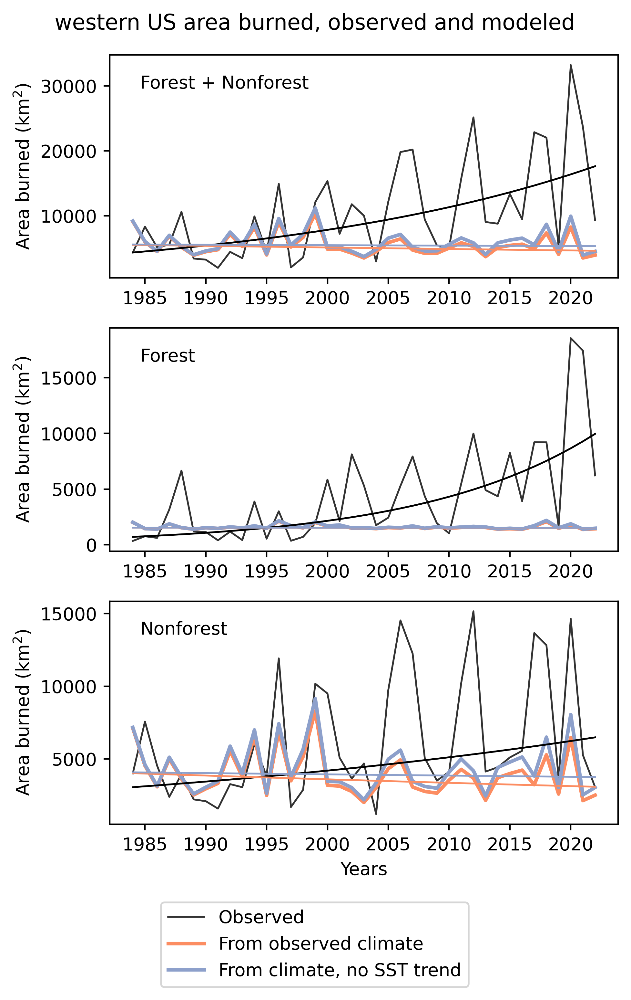

In [17]:
# all of western US area burned, observed and modeled FOREST

# final years
xyears = np.arange(firstyear,finalyear+1,1)
# sum every ecoregion to get entire western US BA
sum_BAclimpredfor = (10**(BAclimpredfor.loc[:,dfnames[1:]])).sum(axis=1) # summed across ecoregions
sum_BAclimpredfor_DT = (10**(BAclimpredfor_DT.loc[:,dfnames[1:]])).sum(axis=1)
sum_BAclimprednon = (10**(BAclimprednon.loc[:,dfnames[1:]])).sum(axis=1) # summed across ecoregions
sum_BAclimprednon_DT = (10**(BAclimprednon_DT.loc[:,dfnames[1:]])).sum(axis=1)
sum_BAclimpredall = sum_BAclimpredfor + sum_BAclimprednon # sum of forest and nonforest
sum_BAclimpredall_DT = sum_BAclimpredfor_DT + sum_BAclimprednon_DT

# put them together
sumswumi = [wumi.loc[:,'0'], wumifor.loc[:,'0'], wuminon.loc[:,'0']]
sumsBA = [sum_BAclimpredall, sum_BAclimpredfor, sum_BAclimprednon]
sumsBA_DT = [sum_BAclimpredall_DT, sum_BAclimpredfor_DT, sum_BAclimprednon_DT]

# line of best fit
tmpm = np.zeros(3)
tmpmBA = np.zeros(3)
tmpmBA_DT = np.zeros(3)
tmpb = np.zeros(3)
tmpbBA = np.zeros(3)
tmpbBA_DT = np.zeros(3)
for i in np.arange(len(tmpm)):
    # wumi lines of best fit
    tmpbestfit = theilslopes(np.log10(sumswumi[i]), x=xyears, method='joint') # regression
    tmpm[i] = tmpbestfit.slope
    tmpb[i] = tmpbestfit.intercept
    # BA model lines of best fit
    tmpbestfit = theilslopes(np.log10(sumsBA[i]), x=xyears, method='joint') # regression
    tmpmBA[i] = tmpbestfit.slope
    tmpbBA[i] = tmpbestfit.intercept
    # detrended BA model lines of best fit
    tmpbestfit = theilslopes(np.log10(sumsBA_DT[i]), x=xyears, method='joint') # regression
    tmpmBA_DT[i] = tmpbestfit.slope
    tmpbBA_DT[i] = tmpbestfit.intercept

# make plot
fig, ax = plt.subplots(3,1, figsize=(5,7))

fig.suptitle('western US area burned, observed and modeled')
for i in np.arange(0,3):
    # plot area burned
    ax[i].plot(sumswumi[i], label='Observed', 
               c='k', alpha=0.8, linewidth=1)
    ax[i].plot(xyears, sumsBA[i], 
               label='From observed climate', 
               c=colorobs, linewidth=2)
    ax[i].plot(xyears, sumsBA_DT[i], 
               label='From climate, no SST trend', 
               c=colorDT, linewidth=2)
    # plot lines of best fit
    ax[i].plot(xyears, 10**(tmpm[i]*xyears+tmpb[i]), 
               linewidth=1, c='k', zorder=3)
    ax[i].plot(xyears, 10**(tmpmBA[i]*xyears+tmpbBA[i]), 
               linewidth=1,c=colorobs, zorder=3)
    ax[i].plot(xyears, 10**(tmpmBA_DT[i]*xyears+tmpbBA_DT[i]), 
               linewidth=1,  c=colorDT, zorder=3)
    # decorate
    ax[i].set_ylabel('Area burned (km$^2$)')


# line of best fit
for i in np.arange(0,3):
    corr_climpred = pearsonr(np.log10(sumswumi[i]), 
                             np.log10(sumsBA[i]))
    #ax[i].annotate("r$^2$(log(BA_obs), log(BA_climate obs) = {:.2f}".format((corr_climpred.rvalue**2)), 
    #            (0.06,0.75), c=colorobs, xycoords='axes fraction' )
    corr_climpred_DT = pearsonr(np.log10(sumswumi[i]), 
                                np.log10(sumsBA_DT[i]))
    #ax[i].annotate("r$^2$(log(BA_obs),log(BA_clim, no SST trend)) = {:.2f}".format(corr_climpred_DT.rvalue**2), 
    #        (0.06,0.65), c=colorDT, xycoords='axes fraction' )
    print('r (log(BA_WUMI), log(BA_from obs clim):', '{:.3}'.format(corr_climpred.statistic))
    print('r (log(BA_WUMI), log(BA_from clim, no SST trend):', '{:.3}'.format(corr_climpred_DT.statistic))

ax[2].set_xlabel('Years')
fig.legend(['Observed', 'From observed climate', 
            'From climate, no SST trend'], 
           bbox_to_anchor=(0.5,-0.05), loc='center')
ax[0].annotate('Forest + Nonforest',(0.06,0.85), c='#000', xycoords='axes fraction' )
ax[1].annotate('Forest',(0.06,0.85), c='#000', xycoords='axes fraction' )
ax[2].annotate('Nonforest',(0.06,0.85), c='#000', xycoords='axes fraction' )
fig.tight_layout()
#plt.savefig(figfolder + 'AGU2022_AreaBurned_models.png')

## Trend from gSST

Contribution of the gSST trend to the observed burned area trend. This means that we are looking for a percentage of the slope from the Theil-sen trendline.

(8/8/2024) For all timeseries, I make all intercepts the **observed BA trendline intercept** for proper % comparison. Add the percent change numbers to the figures.

How much of the trend is from the SST gradient?
(trendline is Theil-Sen)
ALL
$\Delta$ = 340.67 km$^2$/yr
	% change in observed trendline: 306.23 %
$\Delta$ = -23.14 km$^2$/yr
	% change in model(observed clim): -20.81 %
$\Delta$ = -6.68 km$^2$/yr
	% change in model(DT clim): -6.01 %
How much of the trend? -16.46 km2/yr, -4.83 %
FOREST
$\Delta$ = 237.36 km$^2$/yr
	% change in observed trendline: 1320.05 %
$\Delta$ = -1.64 km$^2$/yr
	% change in model(observed clim): -9.11 %
$\Delta$ = -0.35 km$^2$/yr
	% change in model(DT clim): -1.92 %
How much of the trend? -1.29 km2/yr, -0.54 %
NONFOREST
$\Delta$ = 87.84 km$^2$/yr
	% change in observed trendline: 111.92 %
$\Delta$ = -23.97 km$^2$/yr
	% change in model(observed clim): -30.54 %
$\Delta$ = -8.26 km$^2$/yr
	% change in model(DT clim): -10.53 %
How much of the trend? -15.70 km2/yr, -17.88 %


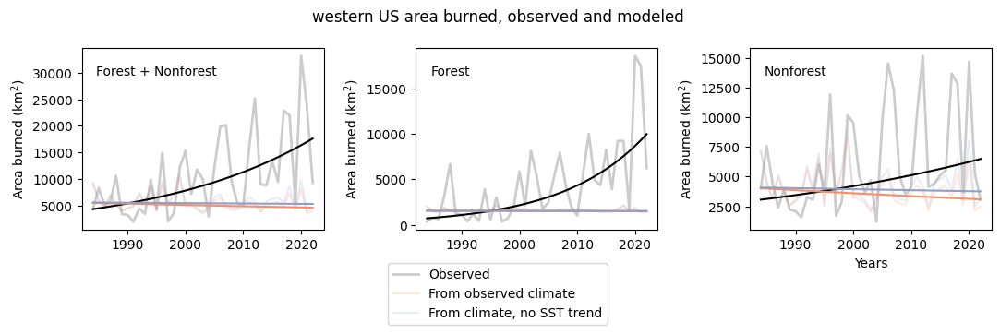

In [18]:
# calculate Theil-Sen trendlines
# (8/8/2024) for timeseries, I make all intercepts the observed BA trendline intercept
# for proper % comparison. Add the percent change to the figures.


xyears = np.arange(firstyear,finalyear+1,1)

# trendlines from observed BA
m_all_obs = theilslopes(np.log10(wumi.iloc[:,0]), x=xyears, method='joint')
m_for_obs = theilslopes(np.log10(wumifor.iloc[:,0]), x=xyears, method='joint')
m_non_obs = theilslopes(np.log10(wuminon.iloc[:,0]), x=xyears, method='joint')

# trendlines from trended scenario (climate-BA model)
m_all_clim = theilslopes(np.log10(sum_BAclimpredall), x=xyears, method='joint')
m_for_clim = theilslopes(np.log10(sum_BAclimpredfor), x=xyears, method='joint')
m_non_clim = theilslopes(np.log10(sum_BAclimprednon), x=xyears, method='joint')

# trendlines from detrended scenario (climate-BA model)
m_all_climdt = theilslopes(np.log10(sum_BAclimpredall_DT), x=xyears, method='joint')
m_for_climdt = theilslopes(np.log10(sum_BAclimpredfor_DT), x=xyears, method='joint')
m_non_climdt = theilslopes(np.log10(sum_BAclimprednon_DT), x=xyears, method='joint')

# what is the trendline contribution?

# small graph of the trendlines to confirm
# all of western US area burned, observed and modeled FOREST

# final years
xyears = np.arange(firstyear,finalyear+1,1)
# sum every ecoregion to get entire western US BA
sum_BAclimpredfor = (10**(BAclimpredfor.loc[:,dfnames[1:]])).sum(axis=1) # summed across ecoregions
sum_BAclimpredfor_DT = (10**(BAclimpredfor_DT.loc[:,dfnames[1:]])).sum(axis=1)
sum_BAclimprednon = (10**(BAclimprednon.loc[:,dfnames[1:]])).sum(axis=1) # summed across ecoregions
sum_BAclimprednon_DT = (10**(BAclimprednon_DT.loc[:,dfnames[1:]])).sum(axis=1)
sum_BAclimpredall = sum_BAclimpredfor + sum_BAclimprednon # sum of forest and nonforest
sum_BAclimpredall_DT = sum_BAclimpredfor_DT + sum_BAclimprednon_DT

sumswumi = [wumi.loc[:,'0'], wumifor.loc[:,'0'], wuminon.loc[:,'0']]
sumsBA = [sum_BAclimpredall, sum_BAclimpredfor, sum_BAclimprednon]
sumsBA_DT = [sum_BAclimpredall_DT, sum_BAclimpredfor_DT, sum_BAclimprednon_DT]

# make plot
fig, ax = plt.subplots(1,3, figsize=(11,3), dpi=50)

fig.suptitle('western US area burned, observed and modeled')
for i in np.arange(0,3):
    ax[i].plot(sumswumi[i], label='Observed', c='k', linewidth=2, alpha=0.2)
    ax[i].plot(xyears, sumsBA[i], label='From observed climate', c=colorobs, alpha=0.2)
    ax[i].plot(xyears, sumsBA_DT[i], label='From climate, no SST trend', c=colorDT, alpha=0.2)
    ax[i].set_ylabel('Area burned (km$^2$)')

ax[2].set_xlabel('Years')
fig.legend(['Observed', 'From observed climate', 'From climate, no SST trend'], bbox_to_anchor=(0.5,-0.05), loc='center')
ax[0].annotate('Forest + Nonforest',(0.06,0.85), c='#000', xycoords='axes fraction' )
ax[1].annotate('Forest',(0.06,0.85), c='#000', xycoords='axes fraction' )
ax[2].annotate('Nonforest',(0.06,0.85), c='#000', xycoords='axes fraction' )

# (8/8/2024) Purposely changed all trendline starts to the observed BA intercept
# plot 1 trendlines
ax[0].plot(xyears, 10**(m_all_obs.slope*xyears+m_all_obs.intercept), c='k')
ax[0].plot(xyears, 10**(m_all_clim.slope*xyears+m_all_clim.intercept), c=colorobs)
ax[0].plot(xyears, 10**(m_all_climdt.slope*xyears+m_all_climdt.intercept), c=colorDT)

# plot 2 trendlines
ax[1].plot(xyears, 10**(m_for_obs.slope*xyears+m_for_obs.intercept), c='k')
ax[1].plot(xyears, 10**(m_for_clim.slope*xyears+m_for_clim.intercept), c=colorobs)
ax[1].plot(xyears, 10**(m_for_climdt.slope*xyears+m_for_climdt.intercept), c=colorDT)

# plot 3 trendlines
ax[2].plot(xyears, 10**(m_non_obs.slope*xyears+m_non_obs.intercept), c='k')
ax[2].plot(xyears, 10**(m_non_clim.slope*xyears+m_non_clim.intercept), c=colorobs)
ax[2].plot(xyears, 10**(m_non_climdt.slope*xyears+m_non_climdt.intercept), c=colorDT)

fig.tight_layout()
#plt.savefig(figfolder + 'AGU2022_AreaBurned_models.png')

# print the trendline contribution
print('How much of the trend is from the SST gradient?\n(trendline is Theil-Sen)')

# calculate the difference in before/after for each to get percent change
# (8/8/2024) Purposely changed percentage change denominator to be obs BA
print('ALL')
tmpinit0 = 10**(m_all_obs.slope*xyears[0]+m_all_obs.intercept)
tmpfinal = 10**(m_all_obs.slope*xyears[-1]+m_all_obs.intercept)
rawchange1all= (tmpfinal-tmpinit0)/len(xyears)
print('$\Delta$ = {:.2f} km$^2$/yr'.format(rawchange1all))
tmppctchange1all = ((tmpfinal - tmpinit0)/tmpinit0)*100
print('\t% change in observed trendline: {:.2f} %'.format(tmppctchange1all))

tmpinit = 10**(m_all_clim.slope*xyears[0]+m_all_clim.intercept)
tmpfinal = 10**(m_all_clim.slope*xyears[-1]+m_all_clim.intercept)
rawchange2all = (tmpfinal-tmpinit)/len(xyears)
print('$\Delta$ = {:.2f} km$^2$/yr'.format(rawchange2all))
tmppctchange2all = ((tmpfinal - tmpinit)/tmpinit0)*100
print('\t% change in model(observed clim): {:.2f} %'.format(tmppctchange2all))

tmpinit = 10**(m_all_climdt.slope*xyears[0]+m_all_climdt.intercept)
tmpfinal = 10**(m_all_climdt.slope*xyears[-1]+m_all_climdt.intercept)
rawchange3all = (tmpfinal-tmpinit)/len(xyears)
print('$\Delta$ = {:.2f} km$^2$/yr'.format(rawchange3all))
tmppctchange3all = ((tmpfinal - tmpinit)/tmpinit0)*100
print('\t% change in model(DT clim): {:.2f} %'.format(tmppctchange3all))

finalrawchange_all = rawchange2all-rawchange3all
finaltrendper_all = (tmppctchange2all-tmppctchange3all)/tmppctchange1all*100
print('How much of the trend? {:.2f} km2/yr, {:.2f} %'.format(finalrawchange_all, finaltrendper_all))





print('FOREST')
tmpinit0 = 10**(m_for_obs.slope*xyears[0]+m_for_obs.intercept)
tmpfinal = 10**(m_for_obs.slope*xyears[-1]+m_for_obs.intercept)
rawchange1for = (tmpfinal-tmpinit0)/len(xyears)
print('$\Delta$ = {:.2f} km$^2$/yr'.format(rawchange1for))
tmppctchange1for = ((tmpfinal - tmpinit0)/tmpinit0)*100
print('\t% change in observed trendline: {:.2f} %'.format(tmppctchange1for))

tmpinit = 10**(m_for_clim.slope*xyears[0]+m_for_clim.intercept)
tmpfinal = 10**(m_for_clim.slope*xyears[-1]+m_for_clim.intercept)
rawchange2for = (tmpfinal-tmpinit)/len(xyears)
print('$\Delta$ = {:.2f} km$^2$/yr'.format(rawchange2for))
tmppctchange2for = ((tmpfinal - tmpinit)/tmpinit0)*100
print('\t% change in model(observed clim): {:.2f} %'.format(tmppctchange2for))

tmpinit = 10**(m_for_climdt.slope*xyears[0]+m_for_climdt.intercept)
tmpfinal = 10**(m_for_climdt.slope*xyears[-1]+m_for_climdt.intercept)
rawchange3for = (tmpfinal-tmpinit)/len(xyears)
print('$\Delta$ = {:.2f} km$^2$/yr'.format(rawchange3for))
tmppctchange3for = ((tmpfinal - tmpinit)/tmpinit0)*100
print('\t% change in model(DT clim): {:.2f} %'.format(tmppctchange3for))

finalrawchange_for = rawchange2for-rawchange3for
finaltrendper_for = (tmppctchange2for-tmppctchange3for)/tmppctchange1for*100
print('How much of the trend? {:.2f} km2/yr, {:.2f} %'.format(finalrawchange_for, finaltrendper_for))




print('NONFOREST')
tmpinit0 = 10**(m_non_obs.slope*xyears[0]+m_non_obs.intercept)
tmpfinal = 10**(m_non_obs.slope*xyears[-1]+m_non_obs.intercept)
rawchange1non = (tmpfinal-tmpinit0)/len(xyears)
print('$\Delta$ = {:.2f} km$^2$/yr'.format(rawchange1non))
tmppctchange1non = ((tmpfinal - tmpinit0)/tmpinit0)*100
print('\t% change in observed trendline: {:.2f} %'.format(tmppctchange1non))

tmpinit = 10**(m_non_clim.slope*xyears[0]+m_non_clim.intercept)
tmpfinal = 10**(m_non_clim.slope*xyears[-1]+m_non_clim.intercept)
rawchange2non = (tmpfinal-tmpinit)/len(xyears)
print('$\Delta$ = {:.2f} km$^2$/yr'.format(rawchange2non))
tmppctchange2non = ((tmpfinal - tmpinit)/tmpinit0)*100
print('\t% change in model(observed clim): {:.2f} %'.format(tmppctchange2non))

tmpinit = 10**(m_non_climdt.slope*xyears[0]+m_non_climdt.intercept)
tmpfinal = 10**(m_non_climdt.slope*xyears[-1]+m_non_climdt.intercept)
rawchange3non = (tmpfinal-tmpinit)/len(xyears)
print('$\Delta$ = {:.2f} km$^2$/yr'.format(rawchange3non))
tmppctchange3non = ((tmpfinal - tmpinit)/tmpinit0)*100
print('\t% change in model(DT clim): {:.2f} %'.format(tmppctchange3non))

finalrawchange_non = rawchange2non-rawchange3non
finaltrendper_non = (tmppctchange2non-tmppctchange3non)/tmppctchange1non*100
print('How much of the trend? {:.2f} km2/yr, {:.2f} %'.format(finalrawchange_non, finaltrendper_non))

## Sum of burned area from gSST

In [19]:
# calculations
print('Proportion of total BA from gSST')
print('all: {:.2f}%'.format((sum_BAclimpredall.sum()-sum_BAclimpredall_DT.sum())/(sum_BAclimpredall.sum())*100))
print('forest: {:.2f}%'.format((sum_BAclimpredfor.sum()-sum_BAclimpredfor_DT.sum())/(sum_BAclimpredfor.sum())*100))
print('nonforest: {:.2f}%'.format((sum_BAclimprednon.sum()-sum_BAclimprednon_DT.sum())/(sum_BAclimprednon.sum())*100))

Proportion of total BA from gSST
all: -8.39%
forest: -1.81%
nonforest: -11.03%


# Percent change maps for observed and SST-predicted ecoregions

* Two maps:
    * first map: % magnitude of the observed BA trend (0-1500%)
    * second map: proportion of the trend that would have changed if ENSO trend was reversed: 
        * ((SST-predicted, negative -  SSTpredicted, observed) / observed % change in BA)*100
        
We calculate with the log-transformed data to avoid the y-intercept being a negative burned area amount.

For calculating the percent change in SST-trended vs. SST-detrended timeseries:

growth = ((predicted - initial) / initial

where predicted = 10^(m*finalyear + b)

and initial = 10^(m*firstyear + b)


In [20]:
# need a custom log percentage formatter for the colorbar
# Custom formatter to handle both positive and negative ticks
# thank you ChatGPT and the GitHub and StackOverflow it is based off.
def format_LogToIntegercolorbar(val, pos):
    if val == 0:
        return "0"
    elif val < 0:
        return f"-{int(-val)}"  # Handle negative values with proper sign
    else:
        return f"{int(val)}"    # Handle positive values

1 WUMI_for 60.72/5.43*100=1117.86
2 WUMI_for 699.15/53.54*100=1305.90
4 WUMI_for nan/nan*100=nan
5 WUMI_for 4.24/6.21*100=68.30
7 WUMI_for nan/nan*100=nan
8 WUMI_for 895.49/22.89*100=3912.54
9 WUMI_for nan/nan*100=nan
10 WUMI_for 569.58/11.48*100=4962.35
12 WUMI_for 106.70/21.53*100=495.68
13 WUMI_for 82.72/18.80*100=439.98
14 WUMI_for 167.54/23.26*100=720.34
15 WUMI_for 1061.90/183.90*100=577.44
16 WUMI_for 138.78/12.05*100=1152.04
17 WUMI_for 276.34/15.57*100=1775.34
19 WUMI_for 3197.14/123.82*100=2582.17
20 WUMI_for 1163.60/24.65*100=4721.09
21 WUMI_for nan/nan*100=nan


/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/scipy/stats/_stats_mstats_common.py:335: RuntimeWarning: invalid value encountered in subtract
  deltay = y[:, np.newaxis] - y


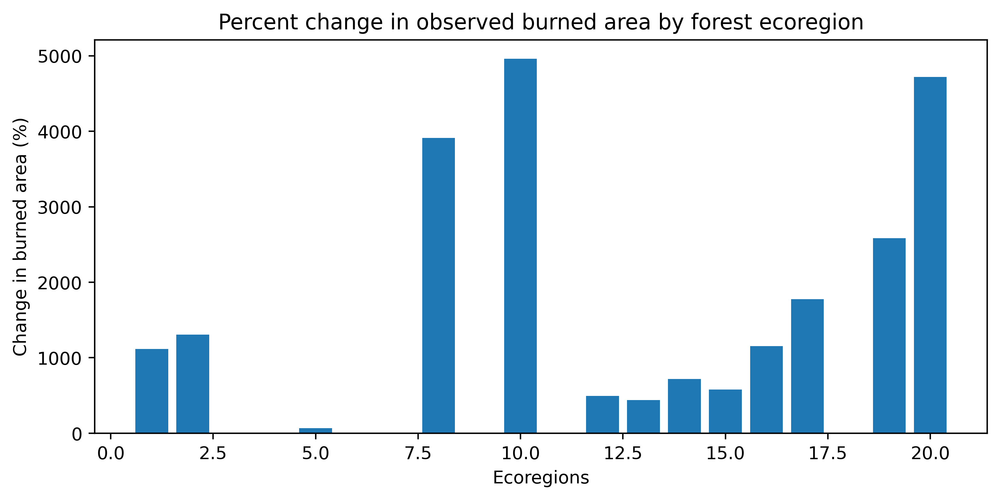

In [21]:
# get OBSERVED burn area trend FORESTS, by ECOPROVINCE
# I used Theil-Sen Trendlines instead of the least-squares, in order
# to get trends while de-emphasizing extremes
trend_wumifor_ecoprov = np.zeros(len(dfnum))
btrendwumifor = np.zeros(len(dfnum))
xplot = np.arange(0, len(wumifor['1']))

# iterate through ecoregion
for i, thisecoreg in enumerate(dfnum):
    # get the timeseries for ecoregion
    sum_wumifor = (wumifor.loc[:,str(thisecoreg)])
    # save the trend
    tmptrend = theilslopes(np.log10(sum_wumifor), x=xplot, method='joint')

    trend_wumifor_ecoprov[i] = tmptrend[0]
    btrendwumifor[i] = tmptrend[1]

# get the percent change in burned area, using the m and b values calculated above
delta_wumifor_ecoprov = np.zeros(len(dfnum))

for i in np.arange(len(dfnum)):
    # wumi observed
    pred = 10**(trend_wumifor_ecoprov[i]*(finalyear-firstyear+1) + btrendwumifor[i])
    init = 10**(trend_wumifor_ecoprov[i]*1 + btrendwumifor[i])
    tmpresult = ((pred - init) / init)*100
    delta_wumifor_ecoprov[i] = tmpresult
    print('{:} WUMI_for {:.2f}/{:.2f}*100={:.2f}'.format(dfnum[i], (pred-init),init,tmpresult))

# check to see the trendlines
fig, ax = plt.subplots(figsize=(9,4))
ax.bar(x=dfnum, height=delta_wumifor_ecoprov)
ax.set_xlabel('Ecoregions')
ax.set_ylabel('Change in burned area (%)')
ax.set_title('Percent change in observed burned area by forest ecoregion');

1 WUMI_non -7.34/114.08*100=-6.43
2 WUMI_non 44.29/21.03*100=210.60
4 WUMI_non 27.28/70.02*100=38.96
5 WUMI_non -23.39/309.34*100=-7.56
7 WUMI_non -0.96/40.11*100=-2.39
8 WUMI_non 152.82/18.77*100=814.27
9 WUMI_non 64.56/94.93*100=68.01
10 WUMI_non 91.15/35.34*100=257.95
12 WUMI_non 627.18/121.49*100=516.26
13 WUMI_non 1751.57/1229.94*100=142.41
14 WUMI_non -64.58/395.11*100=-16.34
15 WUMI_non 195.05/74.34*100=262.38
16 WUMI_non 32.39/36.93*100=87.71
17 WUMI_non 94.54/9.54*100=991.12
19 WUMI_non 309.31/91.66*100=337.44
20 WUMI_non 116.24/27.74*100=418.98
21 WUMI_non nan/nan*100=nan


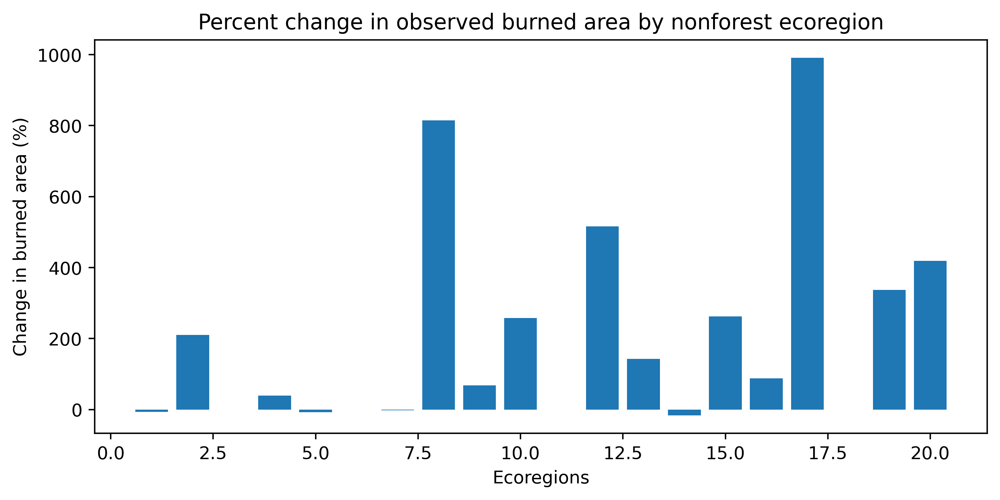

In [22]:
# get OBSERVED burn area trend by NONFORESTS, by ECOPROVINCE
# I used Theil-Sen Trendlines instead of the least-squares, in order
# to get trends while de-emphasizing extremes
trend_wuminon_ecoprov = np.zeros(len(dfnum))
btrendwuminon = np.zeros(len(dfnum))
xplot = np.arange(0, len(wuminon['0']))

# iterate through ecoregion
for i, thisecoreg in enumerate(dfnum):
    # get the timeseries for ecoregion
    sum_wuminon = (wuminon.loc[:,str(thisecoreg)])
    # save the trend
    tmptrend = scipy.stats.mstats.theilslopes(np.log10(sum_wuminon), x=xplot, method='joint')
    trend_wuminon_ecoprov[i] = tmptrend[0]
    btrendwuminon[i] = tmptrend[1]

# get the percent change in burned area, using the m and b values calculated above
delta_wuminon_ecoprov = np.zeros(len(dfnum))

for i in np.arange(len(dfnum)):
    # observed
    pred = 10**(trend_wuminon_ecoprov[i]*(finalyear-firstyear+1) + btrendwuminon[i])
    init = 10**(trend_wuminon_ecoprov[i]*1 + btrendwuminon[i])
    tmpresult = ((pred - init) / init)*100
    delta_wuminon_ecoprov[i] = tmpresult
    print('{:} WUMI_non {:.2f}/{:.2f}*100={:.2f}'.format(dfnum[i], (pred-init),init,tmpresult))

# check to see the trendlines
fig, ax = plt.subplots(figsize=(9,4))
ax.bar(x=dfnum, height=delta_wuminon_ecoprov)
ax.set_xlabel('Ecoregions')
ax.set_ylabel('Change in burned area (%)')
ax.set_title('Percent change in observed burned area by nonforest ecoregion');

## plot percent change in observed burned area (but colored by LOG SCALE)
* This is calculated by WUMI minus the SST-contribution to WUMI (the difference between observed climate into the climate-BA model and SST-removed climate into the climate-BA model.

## Custom Colormap for log(BA) plots

(5/2024) Created a custom colormap with the following requirements:
* Cut the minimum value to 10^2, but maximum is 10^3, so the white needs to be re-centered to the location of zero.
* Red needs to be positive values
* Blue needs to be negative values
* Need to differentiate the 10^2 from 10^1 values. Need a colorbar that can show distinct colors without going rainbow.

(8/2024) using Colorcet
https://colorcet.holoviz.org/user_guide/index.html

In [23]:
# custom colormap attempt 3
# (thanks chatgpt and all that's being trained, 
# including stackoverflow and github)

# Load the CET-D01A colormap from colorcet
# color guide: https://colorcet.holoviz.org/user_guide/index.html
cet_d01a = matplotlib.colormaps['cet_CET_D1A']
#cet_d01a = matplotlib.colormaps['cet_CET_D9'] 

# divergingbwr

# Define the number of colors
N = 256

# Initialize the array for colors with alpha channel set to 1
vals = np.ones((N, 4))

# Split the colormap into 1/3 red and 2/3 blue
num_blue = 1 * N // 7 # for the blue section
num_white = 3 * N // 7 # add white
num_red = 3 * N // 7  # for the red section

# Get the colors from CET-D1A and split into red and blue segments
blue_segment = cet_d01a(np.linspace(0.20, 0.49, num_blue))  # First half for red
white_segment = cet_d01a(np.linspace(0.49, 0.51, num_white))  # Pure white section
red_segment = cet_d01a(np.linspace(0.51, 1, num_red))  # Second half for blue01A and split into red, white, and blue segments


# Combine red and blue segments
newcolors = np.vstack((blue_segment, white_segment, red_segment))

# Create the custom colormap
custom_RdBu3 = mcolors.ListedColormap(newcolors, name='custom_RdBu3')

## Plotting

68.29941543990006
4962.353947102025
-16.343704949878944
991.1150415109978


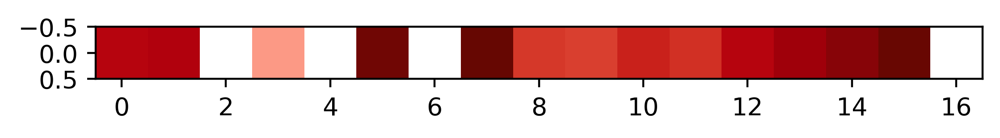

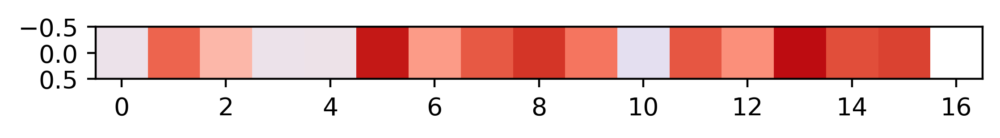

In [24]:
# colorbar
# set vmin and vmax with these
cbarmax = 5000
cbarmin = -100 # minimum possible %

# log-scaled colorbar. 
# linthresh=10 makes the first marker start at 10^1 instead of 10^0
thisnorm = mcolors.SymLogNorm(linthresh=10, base=10,
           vmin=cbarmin, vmax=cbarmax)

# for colorbar
tmpdelta_wumifor = np.expand_dims(delta_wumifor_ecoprov, axis=0)
fig, ax = plt.subplots()
d1 = ax.imshow(tmpdelta_wumifor,cmap=custom_RdBu3, 
               norm=thisnorm)
print(np.nanmin(delta_wumifor_ecoprov))
print(np.nanmax(delta_wumifor_ecoprov))

tmpdelta_wuminon = np.expand_dims(delta_wuminon_ecoprov, axis=0)
fig, ax = plt.subplots()
d1 = ax.imshow(tmpdelta_wuminon, cmap=custom_RdBu3,
              norm=thisnorm)
print(np.nanmin(delta_wuminon_ecoprov))
print(np.nanmax(delta_wuminon_ecoprov))


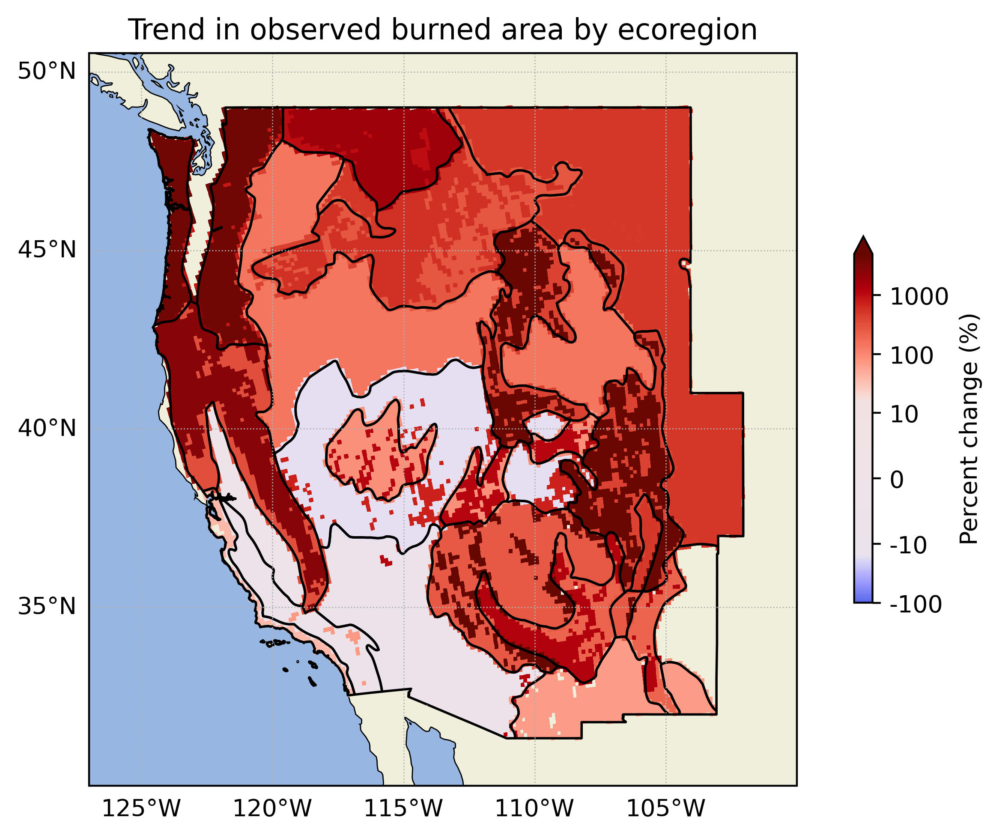

In [25]:
# OBSERVED % change in burned area
# put percent change on map, by forest and nonforest

fig, ax = plt.subplots(figsize=(7,5),
                       subplot_kw={'projection':ccrs.PlateCarree()})

# plot the western US
extent = [-127,-100,30,50]
# add map features
ax.set_extent(extent)
ax.add_feature(LAND, edgecolor='black')
ax.add_feature(OCEAN)
#ax.add_feature(states, linewidth=0.8, edgecolor='k', alpha=0.5, zorder=2)


# PLOT DATA
counter = 0 # start at first province, since 0=allwestUS
# diverging colormap centered at zero

# add the VPD data
for thisregnum in dfnum:
    xr.where((ecoregfor.sel(province=thisregnum))>0,
             delta_wumifor_ecoprov[counter],np.nan).plot(
        ax=ax, cmap=custom_RdBu3, 
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=1,
        norm=thisnorm)
    xr.where((ecoregnon.sel(province=thisregnum))>0,
             delta_wuminon_ecoprov[counter],np.nan).plot(
        ax=ax, cmap=custom_RdBu3,
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=0,
        norm=thisnorm)
    counter+=1

# decorate

# add edgeline of each ecoregion
Becoprov.boundary.plot(linewidth=1,
               edgecolor='k', ax=ax, zorder=2)

# decorate
ax.set_title('Trend in observed burned area by ecoregion')
ax.set_aspect(1.362/1)
#ax.set_yticks(([30, 35, 40, 45, 50]))
#ax.set_xticks((range(-130, -95, 5)))
ax.set_ylabel('Latitude ($^\circ$)')
ax.set_xlabel('Longitude ($^\circ$)')
BAgrid1 = ax.gridlines(xlocs=(range(-130, -95, 5)), 
             ylocs=([30, 35, 40, 45, 50]), crs=ccrs.PlateCarree(), 
             draw_labels=True,
             linewidth=0.5, linestyle=':')
BAgrid1.top_labels = False
BAgrid1.right_labels = False

# colorbar from other jupyterlab cell
thiscbar = fig.colorbar(d1, label='Percent change (%)', extend='max', cmap=custom_RdBu3, shrink=0.5, ax=ax)
thiscbar.formatter = FuncFormatter(format_LogToIntegercolorbar) # change 10^2% to 100%, custom formatter
thiscbar.update_ticks()

ax.set_facecolor("white")
fig.patch.set_alpha(0)

fig.tight_layout()
#plt.savefig(figfolder + 'EcoregMap_pctchange_wumiBA.png')

## plot percent change in DT-scenario burned area TAKE 2 (but colored by LOG SCALE)
* This is model-observed SST trend minus model-detrended SST-scenario trend
* We are only looking at the difference in trend between models, and this should tell us the contribution of the SST gradient trend to burned area in a reasonable way. (8/16/2023)

1 model -1.80/5.43*100=-33.10
1 modelDT -1.80/5.43*100=-33.10
2 model 0.34/53.54*100=0.64
2 modelDT 0.34/53.54*100=0.64
4 model -0.29/nan*100=nan
4 modelDT -0.29/nan*100=nan
5 model 0.75/6.21*100=12.05
5 modelDT 0.75/6.21*100=12.05
7 model 0.00/nan*100=nan
7 modelDT 0.00/nan*100=nan
8 model -6.53/22.89*100=-28.53
8 modelDT -6.53/22.89*100=-28.53
9 model 0.21/nan*100=nan
9 modelDT 0.21/nan*100=nan
10 model -1.89/11.48*100=-16.45
10 modelDT -1.89/11.48*100=-16.45
12 model -5.86/21.53*100=-27.24
12 modelDT -5.91/21.53*100=-27.45
13 model 0.37/18.80*100=1.95
13 modelDT 0.37/18.80*100=1.95
14 model 2.06/23.26*100=8.87
14 modelDT 2.06/23.26*100=8.87
15 model -1.52/183.90*100=-0.83
15 modelDT -1.52/183.90*100=-0.83
16 model -0.95/12.05*100=-7.86
16 modelDT -0.95/12.05*100=-7.86
17 model -4.53/15.57*100=-29.12
17 modelDT -4.53/15.57*100=-29.12
19 model -11.51/123.82*100=-9.30
19 modelDT 34.92/123.82*100=28.20
20 model -8.71/24.65*100=-35.34
20 modelDT -8.71/24.65*100=-35.34
21 model -0.00/nan*

Text(0.5, 1.0, 'Difference (ppts) of gSST-contributed trend by forest ecoregion')

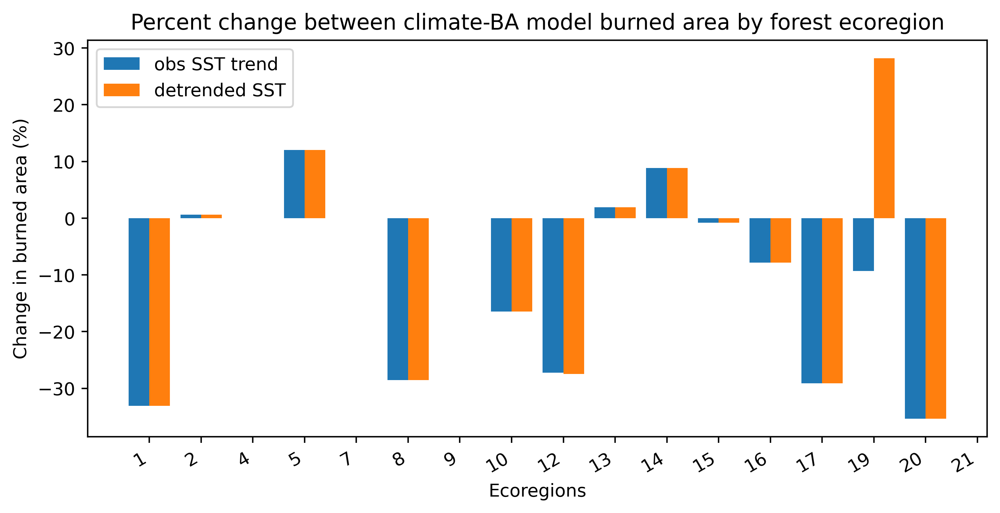

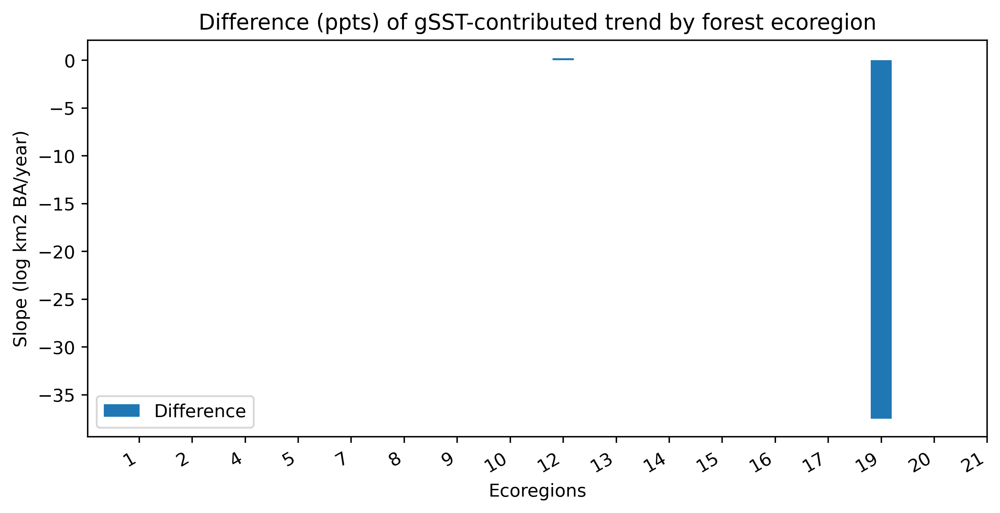

In [26]:
# get MODELED burn area trend FORESTS, by ECOPROVINCE
# I used Theil-Sen Trendlines instead of the least-squares, in order
# to get trends while de-emphasizing extremes
trend_modelfor_ecoprov = np.zeros(len(dfnum))
btrendmodelfor = np.zeros(len(dfnum))
trend_modelforDT_ecoprov = np.zeros(len(dfnum))
btrendmodelforDT = np.zeros(len(dfnum))
xplot = np.arange(0, len(BAclimpredfor['ecoprov1']))

# iterate through ecoregion
for i, thisecoreg in enumerate(dfnum):
    # get the timeseries for ecoregion
    sum_modelfor = (BAclimpredfor.loc[:,dfnames[i+1]])
    sum_modelforDT = (BAclimpredfor_DT.loc[:,dfnames[i+1]])
    # save the trend
    tmptrend = theilslopes(sum_modelfor, x=xplot, method='joint')
    tmptrendDT = theilslopes(sum_modelforDT, x=xplot, method='joint')

    trend_modelfor_ecoprov[i] = tmptrend.slope
    btrendmodelfor[i] = tmptrend.intercept
    trend_modelforDT_ecoprov[i] = tmptrendDT.slope
    btrendmodelforDT[i] = tmptrendDT.intercept

# get the percent change in burned area, using the m and b values calculated above
delta_modelfor_ecoprov = np.zeros(len(dfnum))
delta_modelforDT_ecoprov = np.zeros(len(dfnum))

for i in np.arange(len(dfnum)):
    # model observed SST scenario
    init0 = 10**(trend_wumifor_ecoprov[i]*1+btrendwumifor[i])
    pred = 10**(trend_modelfor_ecoprov[i]*(finalyear-firstyear+1) + btrendmodelfor[i])
    init = 10**(trend_modelfor_ecoprov[i]*1 + btrendmodelfor[i])
    tmpresult = ((pred - init)/(init0))*100
    delta_modelfor_ecoprov[i] = tmpresult
    print('{:} model {:.2f}/{:.2f}*100={:.2f}'.format(dfnum[i], (pred-init),init0,tmpresult))
    # model DT-scenario
    predDT = 10**(trend_modelforDT_ecoprov[i]*(finalyear-firstyear+1) + btrendmodelforDT[i])
    initDT = 10**(trend_modelforDT_ecoprov[i]*1 + btrendmodelforDT[i])
    tmpresult = ((predDT - initDT)/(init0))*100
    delta_modelforDT_ecoprov[i] = tmpresult
    print('{:} modelDT {:.2f}/{:.2f}*100={:.2f}'.format(dfnum[i], (predDT-initDT),init0,tmpresult))

xplot = np.arange(len(dfnum))

# check to see the trendlines
fig, ax = plt.subplots(figsize=(9,4))
ax.bar(x=xplot-0.2, height=delta_modelfor_ecoprov, width=0.4,
       label='obs SST trend')
ax.bar(x=xplot+0.2, height=delta_modelforDT_ecoprov, width=0.4,
       label='detrended SST')
ax.set_xlabel('Ecoregions')
ax.set_xticks(xplot, dfnum, rotation=30, ha='right')
ax.legend()
ax.set_ylabel('Change in burned area (%)')
ax.set_title('Percent change between climate-BA model burned area by forest ecoregion')

# check to see percentage point difference
fig, ax = plt.subplots(figsize=(9,4))
ax.bar(x=xplot, height=(delta_modelfor_ecoprov-delta_modelforDT_ecoprov), width=0.4,
       label='Difference')
ax.set_xlabel('Ecoregions')
ax.legend()
ax.set_xticks(xplot, dfnum, rotation=30, ha='right')
ax.set_ylabel('Slope (log km2 BA/year)')
ax.set_title('Difference (ppts) of gSST-contributed trend by forest ecoregion')

1 model -62.13/114.08*100=-54.46
1 modelDT -32.62/114.08*100=-28.60
2 model -18.68/21.03*100=-88.83
2 modelDT -17.30/21.03*100=-82.26
4 model 2.75/70.02*100=3.92
4 modelDT 2.75/70.02*100=3.92
5 model -27.34/309.34*100=-8.84
5 modelDT 19.40/309.34*100=6.27
7 model 5.55/40.11*100=13.84
7 modelDT 5.55/40.11*100=13.84
8 model -1.15/18.77*100=-6.13
8 modelDT -1.15/18.77*100=-6.13
9 model -0.62/94.93*100=-0.66
9 modelDT -0.62/94.93*100=-0.66
10 model -3.80/35.34*100=-10.76
10 modelDT -3.80/35.34*100=-10.76
12 model 55.74/121.49*100=45.88
12 modelDT 59.94/121.49*100=49.34
13 model -694.82/1229.94*100=-56.49
13 modelDT -396.22/1229.94*100=-32.21
14 model -58.56/395.11*100=-14.82
14 modelDT 35.92/395.11*100=9.09
15 model -1.01/74.34*100=-1.36
15 modelDT -1.01/74.34*100=-1.36
16 model -8.96/36.93*100=-24.26
16 modelDT -0.79/36.93*100=-2.14
17 model 29.06/9.54*100=304.65
17 modelDT 29.06/9.54*100=304.65
19 model -27.05/91.66*100=-29.51
19 modelDT 1.54/91.66*100=1.68
20 model -2.14/27.74*100=-7.71

Text(0.5, 1.0, 'Difference (ppts) of gSST-contributed trend by nonforest ecoregion')

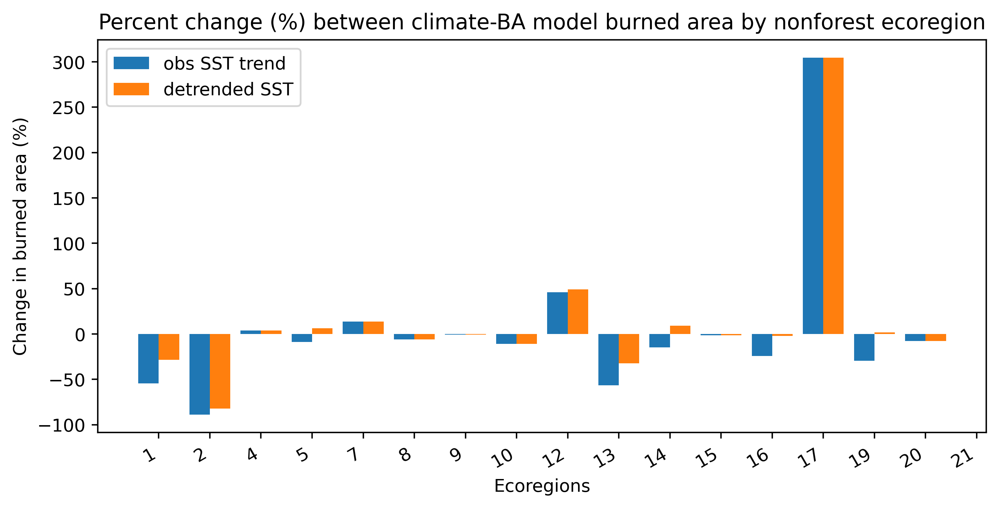

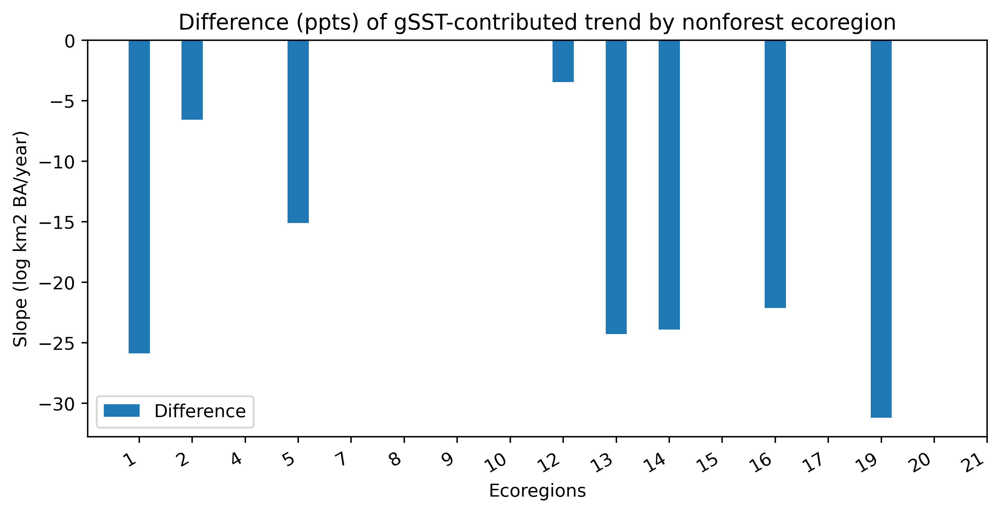

In [27]:
# get MODELED burn area trend by NONFORESTS, by ECOPROVINCE
# I used Theil-Sen Trendlines instead of the least-squares, in order
# to get trends while de-emphasizing extremes
trend_modelnon_ecoprov = np.zeros(len(dfnum))
btrendmodelnon = np.zeros(len(dfnum))
trend_modelnonDT_ecoprov = np.zeros(len(dfnum))
btrendmodelnonDT = np.zeros(len(dfnum))
xplot = np.arange(0, len(BAclimprednon['ecoprov1']))

# iterate through ecoregion
for i, thisecoreg in enumerate(dfnum):
    # get the timeseries for ecoregion
    sum_modelnon = (BAclimprednon.loc[:,dfnames[i+1]])
    sum_modelnonDT = (BAclimprednon_DT.loc[:,dfnames[i+1]])
    # save the trend
    tmptrend = theilslopes(sum_modelnon, x=xplot, method='joint')
    tmptrendDT = theilslopes(sum_modelnonDT, x=xplot, method='joint')
    trend_modelnon_ecoprov[i] = tmptrend.slope
    btrendmodelnon[i] = tmptrend.intercept
    trend_modelnonDT_ecoprov[i] = tmptrendDT.slope
    btrendmodelnonDT[i] = tmptrendDT.intercept

# get the percent change in burned area, using the m and b values calculated above
delta_modelnon_ecoprov = np.zeros(len(dfnum))
delta_modelnonDT_ecoprov = np.zeros(len(dfnum))

for i in np.arange(len(dfnum)):
    # model observed SST scenario
    init0 = 10**(trend_wuminon_ecoprov[i]*1+btrendwuminon[i])
    # (update 8/8/2024: trend is in relation to observed trend initial value)
    # observed
    pred = 10**(trend_modelnon_ecoprov[i]*(finalyear-firstyear+1) + btrendmodelnon[i])
    init = 10**(trend_modelnon_ecoprov[i]*1 + btrendmodelnon[i])
    tmpresult = ((pred - init) / init0)*100
    delta_modelnon_ecoprov[i] = tmpresult
    print('{:} model {:.2f}/{:.2f}*100={:.2f}'.format(dfnum[i], (pred-init),init0,tmpresult))
    # DT-scenario
    predDT = 10**(trend_modelnonDT_ecoprov[i]*(finalyear-firstyear+1) + btrendmodelnonDT[i])
    initDT = 10**(trend_modelnonDT_ecoprov[i]*1 + btrendmodelnonDT[i])
    tmpresult = ((predDT - initDT) / init0)*100
    delta_modelnonDT_ecoprov[i] = tmpresult
    print('{:} modelDT {:.2f}/{:.2f}*100={:.2f}'.format(dfnum[i], (predDT-initDT),init0,tmpresult))

xplot = np.arange(len(dfnum))

# check to see the trendlines
fig, ax = plt.subplots(figsize=(9,4))
ax.bar(x=xplot-0.2, height=delta_modelnon_ecoprov, width=0.4,
       label='obs SST trend')
ax.bar(x=xplot+0.2, height=delta_modelnonDT_ecoprov, width=0.4,
       label='detrended SST')
ax.set_xlabel('Ecoregions')
ax.set_xticks(xplot, dfnum, rotation=30, ha='right')
ax.legend()
ax.set_ylabel('Change in burned area (%)')
ax.set_title('Percent change (%) between climate-BA model burned area by nonforest ecoregion')

# check to see percentage point difference
fig, ax = plt.subplots(figsize=(9,4))
ax.bar(x=xplot, height=(delta_modelnon_ecoprov-delta_modelnonDT_ecoprov), width=0.4,
       label='Difference')
ax.set_xlabel('Ecoregions')
ax.legend()
ax.set_xticks(xplot, dfnum, rotation=30, ha='right')
ax.set_ylabel('Slope (log km2 BA/year)')
ax.set_title('Difference (ppts) of gSST-contributed trend by nonforest ecoregion')

In [28]:
# get the difference between the % increase in burned area
# percentage points (ppts)
# difference will show how much of the observed trend is from SST

delta_modelforDiff_ecoprov = delta_modelfor_ecoprov - np.nan_to_num(delta_modelforDT_ecoprov)
delta_modelnonDiff_ecoprov = delta_modelnon_ecoprov - np.nan_to_num(delta_modelnonDT_ecoprov)

-37.49651347187407
0.20953687285683031
-31.193496745002772
0.0


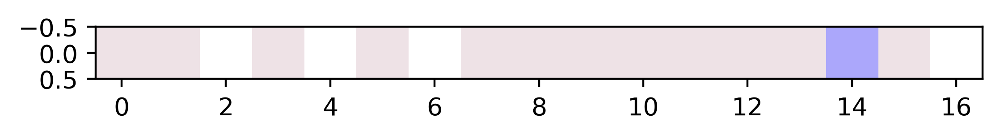

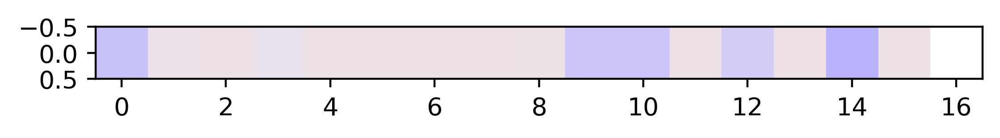

In [29]:
# colorbar
# set vmin and vmax with these
cbarmax = 5000
cbarmin = -100 # minimum possible %
thisplotcmap = custom_RdBu3

# for colorbar
tmpdelta_modelfor = np.expand_dims(delta_modelforDiff_ecoprov, axis=0)
fig, ax = plt.subplots()
d1 = ax.imshow(tmpdelta_modelfor,cmap=custom_RdBu3, 
               norm=mcolors.SymLogNorm(linthresh=10, base=10,
                vmin=cbarmin, vmax=cbarmax))
print(np.nanmin(delta_modelforDiff_ecoprov))
print(np.nanmax(delta_modelforDiff_ecoprov))

tmpdelta_modelnon = np.expand_dims(delta_modelnonDiff_ecoprov, axis=0)
fig, ax = plt.subplots()
d2 = ax.imshow(tmpdelta_modelnon, cmap=custom_RdBu3,
              norm=mcolors.SymLogNorm(linthresh=10, base=10,
            vmin=cbarmin, vmax=cbarmax))
print(np.nanmin(delta_modelnonDiff_ecoprov))
print(np.nanmax(delta_modelnonDiff_ecoprov))


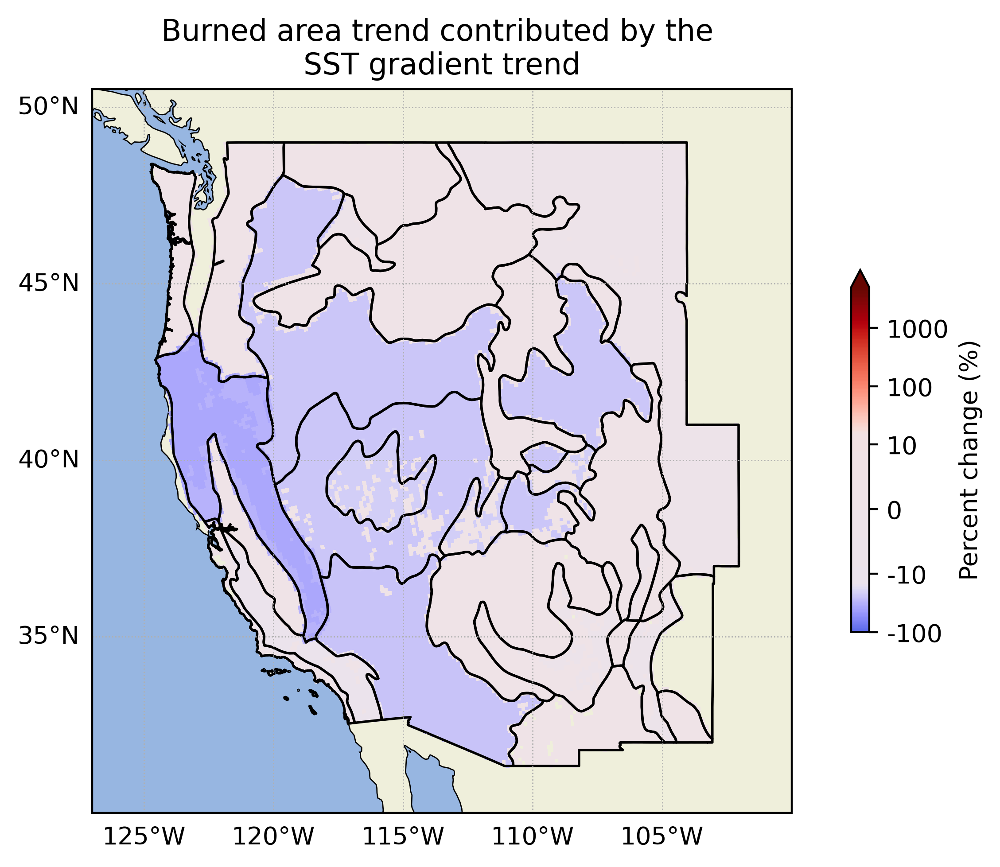

In [30]:
# MODEL DIFFERENCE (by difference in % change) in burned area
# This is the contribution of SST gradient to burned area
thisplotcmap = custom_RdBu3

fig, ax = plt.subplots(figsize=(7,5),
                       subplot_kw={'projection':ccrs.PlateCarree()})
# add map features
ax.set_extent(extent)
ax.add_feature(LAND, edgecolor='black')
ax.add_feature(OCEAN)
#ax.add_feature(states, linewidth=0.8, edgecolor='k', alpha=0.5, zorder=2)


# PLOT DATA
counter = 0 # start at first province, since 0=allwestUS
# add the VPD data
for thisregnum in dfnum:
    xr.where((ecoregfor.sel(province=thisregnum))>0,
             delta_modelforDiff_ecoprov[counter],np.nan).plot(
        ax=ax, cmap=thisplotcmap, 
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=1,
        norm=mcolors.SymLogNorm(linthresh=10, base=10,
           vmin=cbarmin, vmax=cbarmax))
    xr.where((ecoregnon.sel(province=thisregnum))>0,
             delta_modelnonDiff_ecoprov[counter],np.nan).plot(
        ax=ax, cmap=thisplotcmap,
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=0,
        norm=mcolors.SymLogNorm(linthresh=10, base=10,
          vmin=cbarmin, vmax=cbarmax))
    counter+=1

# decorate

# add edgeline of each ecoregion
Becoprov.boundary.plot(linewidth=1,
               edgecolor='k', ax=ax, zorder=2)

# decorate
ax.set_title('Burned area trend contributed by the \nSST gradient trend')
ax.set_aspect(1.362/1)
#ax.set_yticks(([30, 35, 40, 45, 50]))
#ax.set_xticks((range(-130, -95, 5)))
ax.set_ylabel('Latitude ($^\circ$)')
ax.set_xlabel('Longitude ($^\circ$)')
BAgrid2 = ax.gridlines(xlocs=(range(-130, -95, 5)), 
             ylocs=([30, 35, 40, 45, 50]), crs=ccrs.PlateCarree(), 
             draw_labels=True,
             linewidth=0.5, linestyle=':')
BAgrid2.top_labels = False
BAgrid2.right_labels = False

# colorbar from other jupyterlab cell
thiscbar = fig.colorbar(d2, label='Percent change (%)', cmap=thisplotcmap,
             extend='max',shrink=0.5, ax=ax)
thiscbar.formatter = FuncFormatter(format_LogToIntegercolorbar) # change 10^2% to 100%, custom formatter
thiscbar.update_ticks()

ax.set_facecolor("white")
fig.patch.set_alpha(0)

fig.tight_layout()
#plt.savefig(figfolder + 'EcoregMap_pctchange_wumiBA.png')

## Stats for burned area percentage contribution


### filter the data

(1/19/2024)

We need to get the max value from forest and nonforest, but some regions have like 2 pixels that end up being the max value. The goal is to filter out max values in regions that only have a small number (5?) pixels that count as the region's trend, so the maximum value is selected only from what looks visibly feasible on the map.

In [31]:
# create a filter for filtering out small pixel counts
# create a filter for filtering out nan values

# for observed BA
wheremaxvalfor = np.zeros(len(dfnum))
wheremaxvalnon = np.zeros(len(dfnum))

# for contribution from SST gradient
wheremaxvalforSST = np.isnan(delta_modelforDiff_ecoprov)
wheremaxvalnonSST = np.isnan(delta_modelnonDiff_ecoprov)
    
# check for NaN values
tmpfilter2for = np.isnan(delta_wumifor_ecoprov)
tmpfilter2non = np.isnan(delta_wuminon_ecoprov)
tmpfilter3for = np.isnan(delta_modelforDiff_ecoprov)
tmpfilter3non = np.isnan(delta_modelnonDiff_ecoprov)

count = 0
for thisregnum in dfnum:
    tmppixelcount = 5
    tmpfilter = np.count_nonzero((ecoregfor.sel(province=thisregnum))>0)
    if (tmpfilter < tmppixelcount) or (tmpfilter2for[count]==True):
        wheremaxvalfor[count] = 1 # set to "True"
    if (tmpfilter < tmppixelcount) or (tmpfilter3for[count]==True):
        wheremaxvalforSST[count] = 1 # set to "True"
    
    tmpfilter = np.count_nonzero((ecoregnon.sel(province=thisregnum))>0)
    if (tmpfilter < tmppixelcount) or (tmpfilter2non[count]==True):
        wheremaxvalnon[count] = 1 # set to "True"
    if (tmpfilter < tmppixelcount) or (tmpfilter3non[count]==True):
        wheremaxvalnonSST[count] = 1 # set to "True"
    count+=1
wheremaxvalfor = wheremaxvalfor.astype(int)
wheremaxvalnon = wheremaxvalnon.astype(int)
wheremaxvalforSST = wheremaxvalforSST.astype(int)
wheremaxvalnonSST = wheremaxvalnonSST.astype(int)

In [32]:
# print out the stats of model trend predictions

print('\nFOREST')
print('{:35s}MODEL (OBS CLIM) TREND (%), \tMODEL (DT CLIM) TREND (%)\t% OF OBS TREND'.format('NAME'))
for i, thisname in enumerate(prov_abbr_names):
    print('{:34s}'.format(thisname) + '{:.0f}'.format(delta_modelfor_ecoprov[i]) +
         '\t{:.0f}'.format(delta_modelforDT_ecoprov[i])+
         '\t% contrib: {:.0f}'.format(delta_modelforDiff_ecoprov[i]/delta_wumifor_ecoprov[i]*100))

print('\nNONFOREST')
print('{:35s}MODEL (OBS CLIM) TREND (%), \tMODEL (DT CLIM) TREND (%)\t% OF OBS TREND'.format('NAME'))
for i, thisname in enumerate(prov_abbr_names):
    print('{:34s}'.format(thisname) + '{:.0f}'.format(delta_modelnon_ecoprov[i]) + 
         '\t{:.0f}'.format(delta_modelnonDT_ecoprov[i]) + 
         '\t% contrib: {:.0f}'.format(delta_modelnonDiff_ecoprov[i]/delta_wuminon_ecoprov[i]*100))


FOREST
NAME                               MODEL (OBS CLIM) TREND (%), 	MODEL (DT CLIM) TREND (%)	% OF OBS TREND
1: American Semi-Desert           -33	-33	% contrib: 0
2: AZ-NM Mountains                1	1	% contrib: 0
4: CA Coast Chapparral Forest     nan	nan	% contrib: nan
5: CA Coast Range Open Woodland   12	12	% contrib: 0
7: CA Dry Steppe Province         nan	nan	% contrib: nan
8: Cascade Mixed Forest           -29	-29	% contrib: 0
9: Chihuahuan Semi-Desert         nan	nan	% contrib: nan
10: CO Plateau                    -16	-16	% contrib: 0
12: Great Plains                  -27	-27	% contrib: 0
13: IM Semi-Desert                2	2	% contrib: 0
14: IM Semi-Desert and Desert     9	9	% contrib: 0
15: Middle Rocky Mountain Steppe  -1	-1	% contrib: 0
16: NV-UT Mountains               -8	-8	% contrib: 0
17: Northern Rocky Mountain Forest-29	-29	% contrib: 0
19: Sierran Steppe                -9	28	% contrib: -1
20: Southern Rocky Mountain Steppe-35	-35	% contrib: 0
21: SW Plateau and P

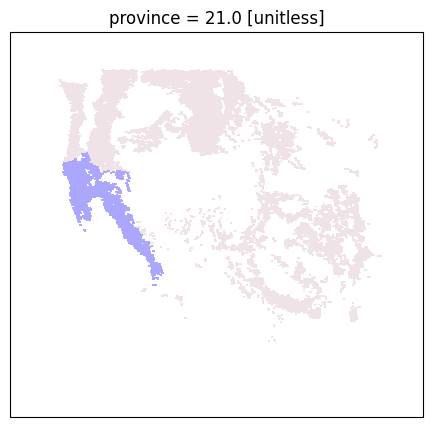

In [33]:
# plot just to look at it
fig, ax = plt.subplots(figsize=(7,5), dpi=50,
                       subplot_kw={'projection':ccrs.PlateCarree()})
# plot the western US
# PLOT DATA
counter = 0 # start at first province, since 0=allwestUS
# diverging colormap centered at zero

# add the VPD data
for thisregnum in dfnum:
    xr.where((ecoregfor.sel(province=thisregnum))>0,
             delta_modelforDiff_ecoprov[counter],np.nan).plot(
        ax=ax, cmap=custom_RdBu3, 
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=1,
        norm=thisnorm)
#    xr.where((ecoregnon.sel(province=thisregnum))>0,
#             delta_modelnonDiff_ecoprov[counter],np.nan).plot(
#        ax=ax, cmap=custom_RdBu3,
#        add_colorbar=False, transform=ccrs.epsg(5070), zorder=0,
#        norm=thisnorm)
    counter+=1

# looks like precipitation affects more of the trend in the north,
# VPD affects more of the trend in the south

In [34]:
# print out some stats for burned area trends and gSST contributed

print('\nFOREST')
print('{:35s}OBS TREND, \tSST CONTRIB TREND (%)'.format('NAME'))
for i, thisname in enumerate(prov_abbr_names):
    print('{:34s}'.format(thisname) + '{:.0f}'.format(delta_wumifor_ecoprov[i]) +
         '\t{:.0f}'.format(delta_modelforDiff_ecoprov[i])+
         '\t% contrib: {:.0f}'.format(delta_modelforDiff_ecoprov[i]/delta_wumifor_ecoprov[i]*100))

# min/max stats for observed
tmpmaxval = np.ma.masked_where(wheremaxvalfor, delta_wumifor_ecoprov).max()
tmpmaxvali = (np.ma.masked_where(wheremaxvalfor, delta_wumifor_ecoprov).argmax())
print('\nMAX obs forest BA trend: \t{:.0f} % in {:}'.format(tmpmaxval,prov_abbr_names[tmpmaxvali]))
tmpminval = np.ma.masked_where(wheremaxvalfor, delta_wumifor_ecoprov).min()
tmpminvali = (np.ma.masked_where(wheremaxvalfor, delta_wumifor_ecoprov).argmin())
print('MIN obs forest BA trend: \t{:.0f} % in {:}'.format(tmpminval,prov_abbr_names[tmpminvali]))

# min/max stats for modeled contrib
tmpmaxval = np.ma.masked_where(wheremaxvalforSST, delta_modelforDiff_ecoprov).max()
tmpmaxvali = (np.ma.masked_where(wheremaxvalforSST, delta_modelforDiff_ecoprov).argmax())
print('\nMAX model contrib to forest BA trend: \t{:.0f} % in {:}'.format(tmpmaxval,prov_abbr_names[tmpmaxvali]))
tmpminval = np.ma.masked_where(wheremaxvalforSST, delta_modelforDiff_ecoprov).min()
tmpminvali = (np.ma.masked_where(wheremaxvalforSST, delta_modelforDiff_ecoprov).argmin())
print('MIN model contrib to forest BA trend: \t{:.0f} % in {:}'.format(tmpminval,prov_abbr_names[tmpminvali]))


print('\nNONFOREST')
print('{:34s}OBS TREND, \tSST CONTRIB TREND (ppts)'.format('NAME'))
for i, thisname in enumerate(prov_abbr_names):
    print('{:34s}'.format(thisname) + '{:.0f}'.format(delta_wuminon_ecoprov[i]) + 
         '\t{:.0f}'.format(delta_modelnonDiff_ecoprov[i]) + 
         '\t% contrib: {:.0f}'.format(delta_modelnonDiff_ecoprov[i]/delta_wuminon_ecoprov[i]*100))

# min/max stats for observed
tmpmaxval = np.ma.masked_where(wheremaxvalnon, delta_wuminon_ecoprov).max()
tmpmaxvali = (np.ma.masked_where(wheremaxvalnon, delta_wuminon_ecoprov).argmax())
print('\nMAX nonforest observed BA trend: \t{:.0f} % in {:}'.format(tmpmaxval,prov_abbr_names[tmpmaxvali]))
tmpminval = np.ma.masked_where(wheremaxvalnon, delta_wuminon_ecoprov).min()
tmpminvali = (np.ma.masked_where(wheremaxvalnon, delta_wuminon_ecoprov).argmin())
print('MIN nonforest obs BA trend: \t{:.0f} % in {:}'.format(tmpminval,prov_abbr_names[tmpminvali]))

# min/max stats for modeled contrib
tmpmaxval = np.ma.masked_where(wheremaxvalnonSST, delta_modelnonDiff_ecoprov).max()
tmpmaxvali = (np.ma.masked_where(wheremaxvalnonSST, delta_modelnonDiff_ecoprov).argmax())
print('\nMAX model contrib to forest BA trend: \t{:.0f} % in {:}'.format(tmpmaxval,prov_abbr_names[tmpmaxvali]))
tmpminval = np.ma.masked_where(wheremaxvalnonSST, delta_modelnonDiff_ecoprov).min()
tmpminvali = (np.ma.masked_where(wheremaxvalnonSST, delta_modelnonDiff_ecoprov).argmin())
print('MIN model contrib to forest BA trend: \t{:.0f} % in {:}'.format(tmpminval,prov_abbr_names[tmpminvali]))



FOREST
NAME                               OBS TREND, 	SST CONTRIB TREND (%)
1: American Semi-Desert           1118	0	% contrib: 0
2: AZ-NM Mountains                1306	0	% contrib: 0
4: CA Coast Chapparral Forest     nan	nan	% contrib: nan
5: CA Coast Range Open Woodland   68	0	% contrib: 0
7: CA Dry Steppe Province         nan	nan	% contrib: nan
8: Cascade Mixed Forest           3913	0	% contrib: 0
9: Chihuahuan Semi-Desert         nan	nan	% contrib: nan
10: CO Plateau                    4962	0	% contrib: 0
12: Great Plains                  496	0	% contrib: 0
13: IM Semi-Desert                440	0	% contrib: 0
14: IM Semi-Desert and Desert     720	0	% contrib: 0
15: Middle Rocky Mountain Steppe  577	0	% contrib: 0
16: NV-UT Mountains               1152	0	% contrib: 0
17: Northern Rocky Mountain Forest1775	0	% contrib: 0
19: Sierran Steppe                2582	-37	% contrib: -1
20: Southern Rocky Mountain Steppe4721	0	% contrib: 0
21: SW Plateau and Plains         nan	nan	% contrib: 

## stats on biggest fires - Ecoprovince 10

In [35]:
# get WUMI fire events only from a specific ecoprovince
thisecoprov = '10'
tmpname = 'Colorado Plateau Semi-Desert Province'

# convert WUMI lat/lon into geopandas geometry
intagency_gpd = gpd.GeoDataFrame(intagency, geometry=gpd.points_from_xy(intagency.final_lon, intagency.final_lat))
intagency_gpd = intagency_gpd.set_crs('EPSG:4326') # set to lon/lat

thisshape = Becoprov[Becoprov.PROVINCE==tmpname] # get the ecoprovince shapefile
# intersect to get only WUMI in ecoregion
int_ecoprov10 = gpd.overlay(intagency_gpd, thisshape, how='intersection')

<GeoAxes: >

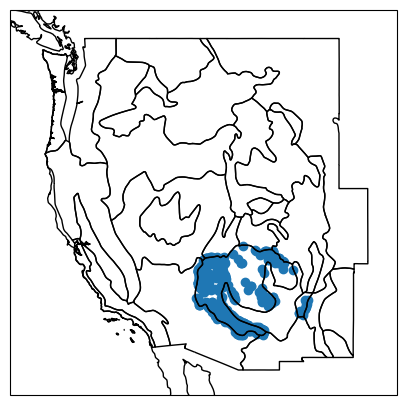

In [36]:
# plot just to look at it
fig, ax = plt.subplots(figsize=(7,5), dpi=50,
                       subplot_kw={'projection':ccrs.PlateCarree()})
# plot the western US
ax.set_extent(extent)
int_ecoprov10.plot(ax=ax)
ax.add_feature(LAND, edgecolor='black', facecolor='white')
# add edgeline of each ecoregion
Becoprov.boundary.plot(linewidth=1,
               edgecolor='k', ax=ax, zorder=2)

In [37]:
# what are the biggest fires in Ecoprovince 10?
# print them by year, and find how that fire contributes to the total forest fire area

for thisyear in [2016,2017,2018,2020]:
    tmpselect = int_ecoprov10[int_ecoprov10.final_year==thisyear].nlargest(5, 'final_area_ha')
    print('Fires in {:}'.format(thisyear))
    thisannualsum = wumi[thisecoprov][thisyear]
    thisannualsumfor = wumifor[thisecoprov][thisyear]
    thisannualsumnon = wuminon[thisecoprov][thisyear]
    tmpselect['proportofyear'] = (tmpselect.final_area_ha*0.01)/ thisannualsum # convert to km2
    tmpselect['proportofyearfor'] = (tmpselect.final_forest_area_ha*0.01) /thisannualsumfor# convert to km2
    tmpselect['proportofyearnon'] = ((tmpselect.final_area_ha-tmpselect.final_forest_area_ha)*0.01)/thisannualsumnon # convert to km2
    for thisrow in np.arange(len(tmpselect.iloc[:,0])):
        print('{:12s}\tarea: {:.2f} km2\tall: {:.2} %\tforest: {:.2f} %\tnf: {:.2f} %'.format(tmpselect.iloc[thisrow]['intagncy_name'],tmpselect.iloc[thisrow]['final_area_ha'],tmpselect.iloc[thisrow]['proportofyear'],tmpselect.iloc[thisrow]['proportofyearfor'],tmpselect.iloc[thisrow]['proportofyearnon']))



Fires in 2016
JUNIPER     	area: 8682.30 km2	all: 0.29 %	forest: 0.33 %	nf: 0.02 %
DOGHEAD     	area: 7270.65 km2	all: 0.24 %	forest: 0.27 %	nf: 0.02 %
FULLER      	area: 5125.05 km2	all: 0.17 %	forest: 0.16 %	nf: 0.29 %
RIM         	area: 3590.37 km2	all: 0.12 %	forest: 0.14 %	nf: 0.00 %
TENDERFOOT  	area: 1514.79 km2	all: 0.051 %	forest: 0.05 %	nf: 0.04 %
Fires in 2017
BROOKLYN    	area: 13466.52 km2	all: 0.26 %	forest: 0.04 %	nf: 0.68 %
GOODWIN     	area: 10167.48 km2	all: 0.19 %	forest: 0.27 %	nf: 0.04 %
HILLTOP     	area: 7388.33 km2	all: 0.14 %	forest: 0.21 %	nf: 0.01 %
HYDE        	area: 7313.49 km2	all: 0.14 %	forest: 0.21 %	nf: 0.00 %
DOVE        	area: 3441.51 km2	all: 0.066 %	forest: 0.10 %	nf: 0.00 %
Fires in 2018
OBI         	area: 3434.58 km2	all: 0.25 %	forest: 0.36 %	nf: 0.04 %
BEARS       	area: 1769.49 km2	all: 0.13 %	forest: 0.18 %	nf: 0.03 %
CAT         	area: 1653.39 km2	all: 0.12 %	forest: 0.18 %	nf: 0.00 %
STUBBS      	area: 961.38 km2	all: 0.069 %	forest: 0.11 %

## stats on biggest fires - Ecoprovince 20

In [38]:
# get WUMI fire events only from a specific ecoprovince
thisecoprov = '20'
tmpname = 'Southern Rocky Mountain Steppe-Open Woodland-Coniferous Forest-Alpine Meadow Province'

# convert WUMI lat/lon into geopandas geometry
intagency_gpd = gpd.GeoDataFrame(intagency, geometry=gpd.points_from_xy(intagency.final_lon, intagency.final_lat))
intagency_gpd = intagency_gpd.set_crs('EPSG:4326') # set to lon/lat

thisshape = Becoprov[Becoprov.PROVINCE==tmpname] # get the ecoprovince shapefile
# intersect to get only WUMI in ecoregion
int_ecoprov20 = gpd.overlay(intagency_gpd, thisshape, how='intersection')

<GeoAxes: >

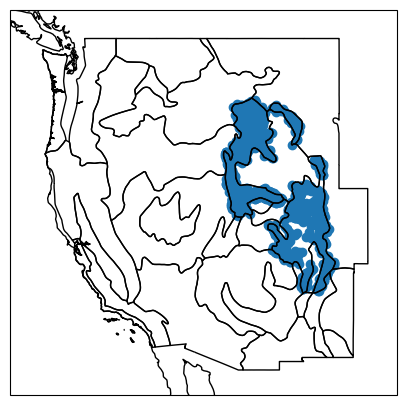

In [39]:
# plot just to look at it
fig, ax = plt.subplots(figsize=(7,5), dpi=50,
                       subplot_kw={'projection':ccrs.PlateCarree()})
# plot the western US
ax.set_extent(extent)
int_ecoprov20.plot(ax=ax)
ax.add_feature(LAND, edgecolor='black', facecolor='white')
# add edgeline of each ecoregion
Becoprov.boundary.plot(linewidth=1,
               edgecolor='k', ax=ax, zorder=2)

In [40]:
# what are the biggest fires in Ecoprovince 20?
# print them by year, and find how that fire contributes to the total forest fire area

for thisyear in [2016,2017,2018,2020]:
    tmpselect = int_ecoprov20[int_ecoprov20.final_year==thisyear].nlargest(5, 'final_area_ha')
    print('Fires in {:}'.format(thisyear))
    thisannualsum = wumi[thisecoprov][thisyear]
    thisannualsumfor = wumifor[thisecoprov][thisyear]
    thisannualsumnon = wuminon[thisecoprov][thisyear]
    tmpselect['proportofyear'] = (tmpselect.final_area_ha*0.01)/ thisannualsum # convert to km2
    tmpselect['proportofyearfor'] = (tmpselect.final_forest_area_ha*0.01) /thisannualsumfor# convert to km2
    tmpselect['proportofyearnon'] = ((tmpselect.final_area_ha-tmpselect.final_forest_area_ha)*0.01)/thisannualsumnon # convert to km2
    for thisrow in np.arange(len(tmpselect.iloc[:,0])):
        print('{:12s}\tarea: {:.2f} km2\tall: {:.2} %\tforest: {:.2f} %\tnf: {:.2f} %'.format(tmpselect.iloc[thisrow]['intagncy_name'],tmpselect.iloc[thisrow]['final_area_ha'],tmpselect.iloc[thisrow]['proportofyear'],tmpselect.iloc[thisrow]['proportofyearfor'],tmpselect.iloc[thisrow]['proportofyearnon']))



Fires in 2016
BEAVER CREEK	area: 15113.52 km2	all: 0.17 %	forest: 0.18 %	nf: 0.12 %
MAPLE       	area: 14583.60 km2	all: 0.16 %	forest: 0.16 %	nf: 0.18 %
CLIFF CREEK 	area: 11667.24 km2	all: 0.13 %	forest: 0.14 %	nf: 0.08 %
BERRY       	area: 6800.85 km2	all: 0.075 %	forest: 0.08 %	nf: 0.04 %
HAYDEN PASS 	area: 6148.80 km2	all: 0.068 %	forest: 0.08 %	nf: 0.00 %
Fires in 2017
UNKNOWN     	area: 5260.92 km2	all: 0.19 %	forest: 0.00 %	nf: 0.47 %
PEEKABOO    	area: 4524.03 km2	all: 0.16 %	forest: 0.12 %	nf: 0.22 %
TANK HOLLOW 	area: 3522.78 km2	all: 0.12 %	forest: 0.19 %	nf: 0.02 %
WINTER VALLEY	area: 2848.23 km2	all: 0.1 %	forest: 0.05 %	nf: 0.17 %
BONITA      	area: 2759.13 km2	all: 0.098 %	forest: 0.16 %	nf: 0.00 %
Fires in 2018
SPRING CREEK	area: 37841.58 km2	all: 0.18 %	forest: 0.18 %	nf: 0.19 %
POLE CREEK  	area: 32773.86 km2	all: 0.16 %	forest: 0.15 %	nf: 0.18 %
DOLLAR RIDGE	area: 23099.13 km2	all: 0.11 %	forest: 0.10 %	nf: 0.15 %
416         	area: 18017.55 km2	all: 0.087 %	forest:

## the biggest fires contribute the most to annual burned area

The trend seen in forest fire area (Fig 4) can can be attributed to a few very large fires that have contributed nearly 90% of the area burned in each year.

In [41]:
# for year, find top 10% of forest fires, sum their area, 
# and check their contribution (%) compared to annual forest area burned

# store all the proportions
proportionfinal = np.zeros(len(np.arange(firstyear, intagency.final_year.max()+1)))
counter = 0
for thisyear in np.arange(firstyear, intagency.final_year.max()):
    tmptopten = int(np.round(len(intagency[intagency.final_year==thisyear])*.1))
    tmpselect = intagency[intagency.final_year==thisyear].nlargest(tmptopten, 'final_forest_area_ha')
    # total area burned from top 10% of forest fires, convert to km2
    thistoptenannualsum = tmpselect.final_forest_area_ha.sum()*0.01
    # total area burned in this year
    thisannualsumfor = wumifor['0'][thisyear]
    
    thisproportionfinal = (thistoptenannualsum/ thisannualsumfor)
    proportionfinal[counter] = thisproportionfinal
    print('{:} topten%: {:} fires,\tBA: {:.2f} km2,\tprop: {:.2f} %'.format(thisyear, tmptopten, thisannualsumfor, thisproportionfinal))
    counter+=1

print('\naverage contribution (forest): {:.2} %'.format(proportionfinal.mean()))

1984 topten%: 13 fires,	BA: 332.00 km2,	prop: 0.68 %
1985 topten%: 19 fires,	BA: 751.96 km2,	prop: 0.64 %
1986 topten%: 22 fires,	BA: 607.89 km2,	prop: 0.55 %
1987 topten%: 34 fires,	BA: 3164.71 km2,	prop: 0.69 %
1988 topten%: 35 fires,	BA: 6653.44 km2,	prop: 0.81 %
1989 topten%: 24 fires,	BA: 1190.30 km2,	prop: 0.56 %
1990 topten%: 17 fires,	BA: 1141.68 km2,	prop: 0.72 %
1991 topten%: 13 fires,	BA: 389.39 km2,	prop: 0.52 %
1992 topten%: 19 fires,	BA: 1170.39 km2,	prop: 0.75 %
1993 topten%: 13 fires,	BA: 410.31 km2,	prop: 0.64 %
1994 topten%: 50 fires,	BA: 3873.10 km2,	prop: 0.73 %
1995 topten%: 18 fires,	BA: 534.60 km2,	prop: 0.64 %
1996 topten%: 41 fires,	BA: 2998.40 km2,	prop: 0.72 %
1997 topten%: 10 fires,	BA: 348.82 km2,	prop: 0.58 %
1998 topten%: 20 fires,	BA: 701.40 km2,	prop: 0.51 %
1999 topten%: 36 fires,	BA: 1923.32 km2,	prop: 0.72 %
2000 topten%: 48 fires,	BA: 5840.75 km2,	prop: 0.73 %
2001 topten%: 32 fires,	BA: 2120.23 km2,	prop: 0.65 %
2002 topten%: 32 fires,	BA: 8118.75 

In [42]:
# create row of nonforest area
intagency['final_nonforest_area_ha'] = intagency['final_area_ha'] - intagency['final_forest_area_ha']

In [43]:
# for year, find top 10% of forest fires, sum their area, 
# and check their contribution (%) compared to annual forest area burned

# store all the proportions
proportionfinal = np.zeros(len(np.arange(firstyear, intagency.final_year.max()+1)))
counter = 0
for thisyear in np.arange(firstyear, intagency.final_year.max()):
    tmptopten = int(np.round(len(intagency[intagency.final_year==thisyear])*.1))
    tmpselect = intagency[intagency.final_year==thisyear].nlargest(tmptopten, 'final_nonforest_area_ha')
    # total area burned from top 10% of forest fires, convert to km2
    thistoptenannualsum = tmpselect.final_nonforest_area_ha.sum()*0.01
    # total area burned in this year
    thisannualsumnon = wuminon['0'][thisyear]
    
    thisproportionfinal = (thistoptenannualsum/ thisannualsumnon)
    proportionfinal[counter] = thisproportionfinal
    print('{:} topten%: {:} fires,\tBA: {:.2f} km2,\tprop: {:.2f} %'.format(thisyear, tmptopten, thisannualsumnon, thisproportionfinal))
    counter+=1

print('\naverage contribution (nonforest): {:.2} %'.format(proportionfinal.mean()))

1984 topten%: 13 fires,	BA: 4006.54 km2,	prop: 0.20 %
1985 topten%: 19 fires,	BA: 7573.08 km2,	prop: 0.24 %
1986 topten%: 22 fires,	BA: 4537.63 km2,	prop: 0.21 %
1987 topten%: 34 fires,	BA: 2394.42 km2,	prop: 0.25 %
1988 topten%: 35 fires,	BA: 3949.73 km2,	prop: 0.40 %
1989 topten%: 24 fires,	BA: 2220.70 km2,	prop: 0.19 %
1990 topten%: 17 fires,	BA: 2097.58 km2,	prop: 0.40 %
1991 topten%: 13 fires,	BA: 1587.14 km2,	prop: 0.44 %
1992 topten%: 19 fires,	BA: 3270.89 km2,	prop: 0.31 %
1993 topten%: 13 fires,	BA: 3059.76 km2,	prop: 0.20 %
1994 topten%: 50 fires,	BA: 6027.20 km2,	prop: 0.26 %
1995 topten%: 18 fires,	BA: 3804.31 km2,	prop: 0.22 %
1996 topten%: 41 fires,	BA: 11919.94 km2,	prop: 0.31 %
1997 topten%: 10 fires,	BA: 1695.81 km2,	prop: 0.08 %
1998 topten%: 20 fires,	BA: 2883.39 km2,	prop: 0.25 %
1999 topten%: 36 fires,	BA: 10173.41 km2,	prop: 0.52 %
2000 topten%: 48 fires,	BA: 9505.86 km2,	prop: 0.31 %
2001 topten%: 32 fires,	BA: 5089.24 km2,	prop: 0.42 %
2002 topten%: 32 fires,	BA

2006 topten%: 53 fires,	BA: 14528.64 km2,	prop: 0.43 %
2007 topten%: 40 fires,	BA: 12257.56 km2,	prop: 0.61 %
2008 topten%: 36 fires,	BA: 5059.90 km2,	prop: 0.41 %
2009 topten%: 27 fires,	BA: 3510.70 km2,	prop: 0.50 %
2010 topten%: 20 fires,	BA: 4122.93 km2,	prop: 0.15 %
2011 topten%: 33 fires,	BA: 10249.86 km2,	prop: 0.41 %
2012 topten%: 47 fires,	BA: 15158.32 km2,	prop: 0.51 %
2013 topten%: 25 fires,	BA: 4134.84 km2,	prop: 0.54 %
2014 topten%: 25 fires,	BA: 4428.94 km2,	prop: 0.47 %
2015 topten%: 38 fires,	BA: 5109.20 km2,	prop: 0.69 %
2016 topten%: 32 fires,	BA: 5560.23 km2,	prop: 0.34 %
2017 topten%: 47 fires,	BA: 13662.37 km2,	prop: 0.54 %
2018 topten%: 37 fires,	BA: 12828.02 km2,	prop: 0.56 %
2019 topten%: 23 fires,	BA: 3680.33 km2,	prop: 0.37 %

average contribution (nonforest): 0.36 %


In [44]:
# top fires in specific years (nonforest)
selectyears = [2006, 2011, 2017, 2018, 2020]
for thisyear in selectyears:
    print(thisyear)
    tmpfires = intagency[intagency.final_year==thisyear]
    tmpfires.sort_values(by='final_nonforest_area_ha', ascending=False, inplace=True)
    for index, row in tmpfires.iloc[0:5,:].iterrows():
        print('{:}\t{:}'.format(row.MTBS_name, row.final_nonforest_area_ha))

2006
WINTERS	73848.45999999999
DAY	44159.25
BLACK PULASKI COMPLEX	34201.81
AMAZON	32887.75
BUNDY RAILROAD	31450.52
2011
ROCK HOUSE	87799.18
INDIAN CREEK	39165.42
IRON MOUNTAIN	31760.559999999998
DONALDSON	26515.85
0655 RAZOR BACK EAST	20062.21
2017
BRIDGE COULEE	79621.09
THOMAS	78186.05
SNOWSTORM	51468.99
TRUCKEE	36607.43
TOHAKUM 2	35322.38
2018
MARTIN	162275.16
SOUTH SUGARLOAF	85430.26999999999
RANCH	42052.67
GOOSE CREEK	40079.840000000004
COUNTY	36096.950000000004
2020
HENNESSEY	78724.32
PEARL HILL	72536.69
COLD SPRINGS	65227.649999999994
BUSH	53231.350000000006
AUGUST COMPLEX	48546.109999999986


/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_27898/1188890227.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmpfires.sort_values(by='final_nonforest_area_ha', ascending=False, inplace=True)


## burned area coincides with VPD

(Feb 1, 2024) 

Burned area in non-forest regions has these spikes of high BA in in 2006-2007, 2011-2012, 2017-2018, and 2020. 

My plot Shows that these do not relate very well to higher vpd. Low fire also relates to high VPD, and 

In [45]:
# import VPD data
#vpd_string = '12km\\climate\\primary\\vpd.nc'
vpd_string = '12km//climate//primary//vpd.nc'
vpd = xr.open_dataset(directory + vpd_string, engine='netcdf4')

# prep data for correlation comparison
firstclimtime = str(firstyear-1)+'-01-01'

def is_springseason(month):
    return (month >= 4) & (month <=9)

# resample all data at yearly timescale (takes a while)
# get only spring data and resample by year
vpd_spring = vpd.sel(time=is_springseason(vpd['time.month'])).resample(time='Y').mean()
vpd_spring = vpd_spring.vpd.loc[firstclimtime:finaltime]

del vpd

In [46]:
# iterate through each ecoregion, sum vpd trend
# get the vpd trends by ecoregion (not incl. entire western US)
years = np.arange(firstyear-1, finalyear+1)
vpd_obs_trendfor = np.zeros(len(dfnames)-1) # storage, intercept
vpd_obs_trendnon = np.zeros(len(dfnames)-1)
vpd_obs_bfor = np.zeros(len(dfnames)-1) # storage, slope
vpd_obs_bnon = np.zeros(len(dfnames)-1)
vpd_timeseries_for = [] # storage, timeseries
vpd_timeseries_non = []

# iterate through to get the forest and nonforest timeseries
# and get trends for each
counter = 0
for thisregion in ecoreg:
    #print('region '+str(counter+1)+'/'+str(len(dfnum)))
    # calculate vpd, store timeseries
    tmpvpdfor = (in_forest(vpd_spring, thisregion))
    vpd_timeseries_for.append(tmpvpdfor.values)
    tmpvpdnon = in_nonforest(vpd_spring, thisregion)
    vpd_timeseries_non.append(tmpvpdnon.values)

    # store trendline
    tmpvpdtrendfor = scipy.stats.linregress(years, tmpvpdfor.values)
    tmpvpdtrendnon = scipy.stats.linregress(years, tmpvpdnon.values)
    vpd_obs_trendfor[counter] = tmpvpdtrendfor.slope
    vpd_obs_trendnon[counter] = tmpvpdtrendnon.slope
    vpd_obs_bfor[counter] = tmpvpdtrendfor.intercept
    vpd_obs_bnon[counter] = tmpvpdtrendnon.intercept
    counter+=1

forest: statistic = 0.902, pvalue=4.3e-15
nonforest: statistic = 0.528, pvalue=0.00054


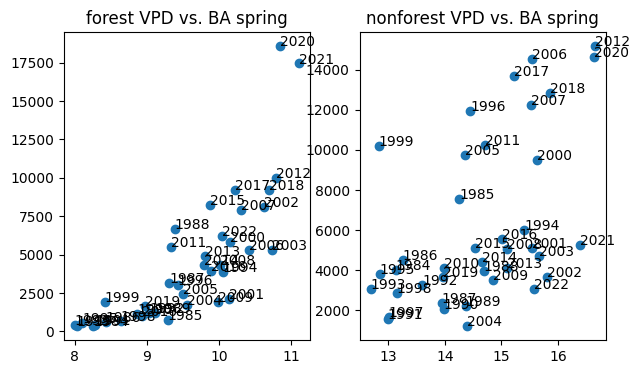

In [47]:
# start with vpd_spring, made earlier for Fig. 1
vpd_nonforest_wUS = in_nonforest(vpd_spring, westUS).values.flatten()
vpd_forest_wUS = in_forest(vpd_spring, westUS).values.flatten()

k = 1 # cut off one year to start at 1984
# plot to compare
fig, ax = plt.subplots(1,2,figsize=((7,4)),dpi=50)
ax[0].scatter(vpd_forest_wUS[k:], wumifor.loc[:,'0'])
ax[1].scatter(vpd_nonforest_wUS[k:], wuminon.loc[:,'0'])
ax[0].set_title('forest VPD vs. BA spring')
ax[1].set_title('nonforest VPD vs. BA spring')
for i, txt in enumerate(years[k:]):
    ax[0].annotate(str(txt), (vpd_forest_wUS[k:][i], wumifor.loc[:,'0'][i+1984]))
    ax[1].annotate(str(txt), (vpd_nonforest_wUS[k:][i], wuminon.loc[:,'0'][i+1984]))

# linear regression
tmpcorrfor = pearsonr(vpd_forest_wUS[k:], np.log10(wumifor.loc[:,'0']))
tmpcorrnon = pearsonr(vpd_nonforest_wUS[k:], np.log10(wuminon.loc[:,'0']))
print('forest: statistic = {:.3f}, pvalue={:.2}'.format(tmpcorrfor.statistic, tmpcorrfor.pvalue))
print('nonforest: statistic = {:.3f}, pvalue={:.2}'.format(tmpcorrnon.statistic, tmpcorrnon.pvalue))

## Block bootstrap for significance trends

(12/20/2024)

Add in block bootstrap of `n` repetitions that will let us know if the trend we're seeing falls within the normal distribution of possible trends. When calculating the fraction or p-value, the absolute value of the trends in the bootstrapped data must exceed the observed/modeled trend.

In [48]:
# printing significance
def addSigMarker(pvalue):
    """
    Add an asterisk for values that are significant.
    p<0.05, add *
    p<0.01, add **
    otherwise add an empty space
    """
    if pvalue<0.01:
        adddot = '**' # significance marker
    elif pvalue<0.05:
        adddot = '*'# add significance marker
    else:
        adddot = ' ' # no significance
    return adddot

In [49]:
# block bootstrap for all western US

nmembers = 10000
trendmembersobs = np.zeros((len(sumswumi), nmembers)) # storage
trendmembers = np.zeros((len(sumsBA), nmembers))
trendmembersDT = np.zeros((len(sumsBA_DT), nmembers))
block_size = 3 # grab x years at a time
block_size_extra = 2

# line of best fit from the observed and model
tmpm = np.zeros(3)
tmpmBA = np.zeros(3)
tmpmBA_DT = np.zeros(3)
tmpb = np.zeros(3)
tmpbBA = np.zeros(3)
tmpbBA_DT = np.zeros(3)
for i in np.arange(len(tmpm)):
    # wumi lines of best fit (theil-sen!!!!)
    tmpbestfit = theilslopes(np.log10(sumswumi[i]), x=xyears, method='joint') # regression
    tmpm[i] = tmpbestfit.slope
    tmpb[i] = tmpbestfit.intercept
    # BA model lines of best fit
    tmpbestfit = theilslopes(np.log10(sumsBA[i]), x=xyears, method='joint') # regression
    tmpmBA[i] = tmpbestfit.slope
    tmpbBA[i] = tmpbestfit.intercept
    # detrended BA model lines of best fit
    tmpbestfit = theilslopes(np.log10(sumsBA_DT[i]), x=xyears, method='joint') # regression
    tmpmBA_DT[i] = tmpbestfit.slope
    tmpbBA_DT[i] = tmpbestfit.intercept

# begin nmembers-length block bootstrap
for j in np.arange(0,len(sumsBA)):
    tmpwumi = sumswumi[j]
    tmpBA = sumsBA[j]
    tmpBA_DT = sumsBA_DT[j]
    # do nmembers-length block bootstrap
    for i in np.arange(0,nmembers):
        # block the data into consecutive-year chunks
        tmpblocksobs = [tmpwumi[i:i+block_size] for i in range(0, len(xyears), block_size)]
        tmpblocks = [tmpBA[i:i+block_size] for i in range(0, len(xyears), block_size)]
        tmpblocksDT = [tmpBA_DT[i:i+block_size] for i in range(0, len(xyears), block_size)]
        # if last block is only 2, I'll add one more year from previous block
        # tmpblocks.append(tmptimes[-block_size:])  # Last block of size 3
        # commented out: originally would be last block of size 2
        # tmpblocks.append(tmptimes[-block_size_extra:])  # Last block of size 3
        
        # randomly sample from blocks to get reshuffled timeseries
        num_blocks = len(tmpblocks)
        resampledi = np.random.choice(range(num_blocks), size=num_blocks, replace=True)
        # combine
        bootstrapped_timesobs = np.concatenate([tmpblocksobs[i] for i in resampledi])
        bootstrapped_times = np.concatenate([tmpblocks[i] for i in resampledi])
        bootstrapped_timesDT = np.concatenate([tmpblocksDT[i] for i in resampledi])
        # cut the timeseries so that it's always the same length as the original
        bootstrapped_timesobs = bootstrapped_timesobs[0:len(xyears)]
        bootstrapped_times = bootstrapped_times[0:len(xyears)]
        bootstrapped_timesDT = bootstrapped_timesDT[0:len(xyears)]

        # calculate the trend wumi observed
        reg = theilslopes(np.log10(bootstrapped_timesobs), x=xyears, method='joint') # regression
        m = reg.slope
        trendmembersobs[j,i] = m # save the slope
        # calculate the trend
        reg = theilslopes(np.log10(bootstrapped_times), x=xyears, method='joint') # regression
        m = reg.slope
        trendmembers[j,i] = m # save the slope
        # calculate the trend DT
        reg = theilslopes(np.log10(bootstrapped_timesDT), x=xyears, method='joint') # regression
        m = reg.slope
        trendmembersDT[j,i] = m # save the slope
        
# calculate fraction with slope>observed trend
fractrendobs = np.zeros(len(sumswumi)) # storage
fractrend = np.zeros(len(sumsBA))
fractrendDT = np.zeros(len(sumsBA_DT))

for j in np.arange(0,len(sumsBA)):
    tmpobstrend = tmpm[j] # observed trend
    tmpboottrend = np.abs(trendmembersobs[j,:]) # bootstrapped trends
    # fraction above observed trend, which is the p-value
    fractrendobs[j] = ((tmpboottrend > tmpobstrend).sum())/nmembers

    tmpobstrend = tmpmBA[j] # observed trend
    tmpboottrend = np.abs(trendmembers[j,:]) # bootstrapped trends
    # fraction above observed trend, which is the p-value
    fractrend[j] = ((tmpboottrend > tmpobstrend).sum())/nmembers

    tmpobstrend = tmpmBA_DT[j] # observed trend
    tmpboottrend = np.abs(trendmembersDT[j,:]) # bootstrapped trends
    # fraction above observed trend, which is the p-value
    fractrendDT[j] = ((tmpboottrend > tmpobstrend).sum())/nmembers


In [50]:
# add significance for figures
fracsigobs = []
fracsig = []
fracsigDT = []
for j in np.arange(0,len(sumsBA)):
    fracsigobs.append(addSigMarker(fractrendobs[j]))
    fracsig.append(addSigMarker(fractrend[j]))
    fracsigDT.append(addSigMarker(fractrendDT[j]))

# Combined Figure 4

cbarmin = -100
cbarmax = 5000


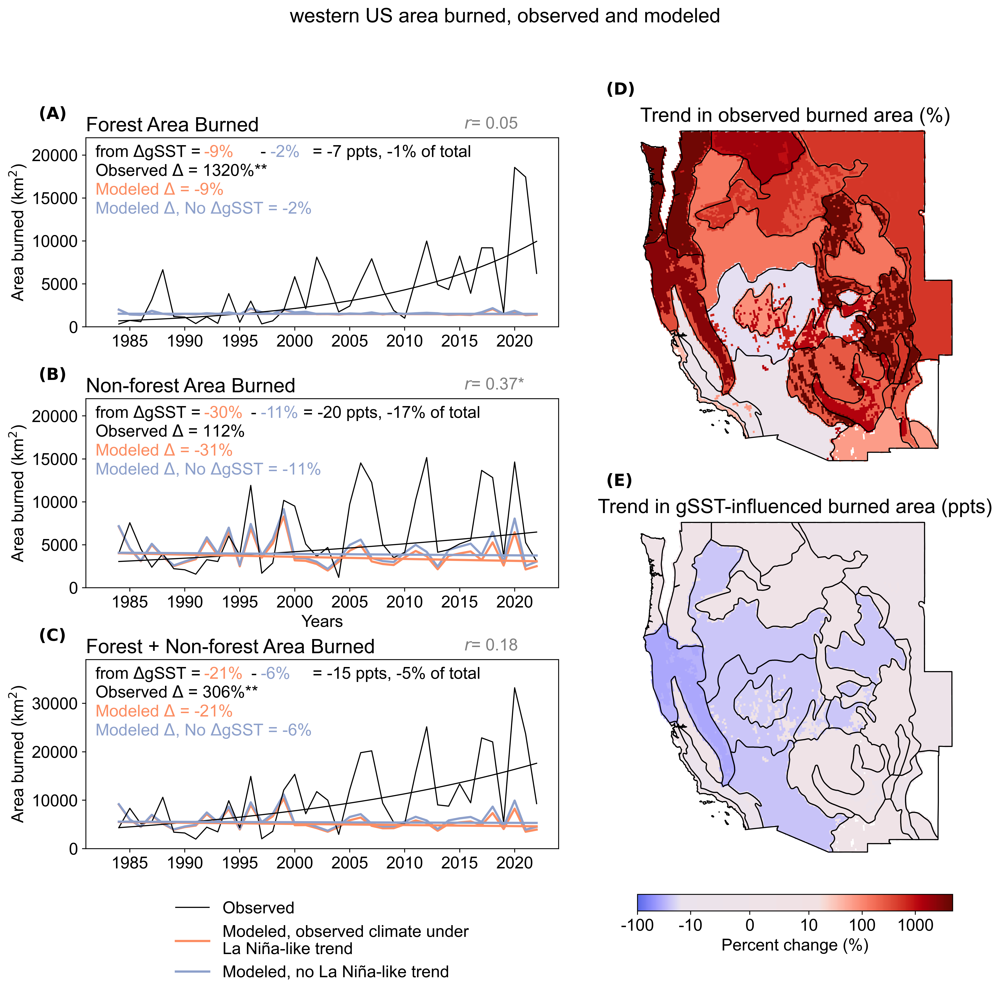

In [51]:
fig = plt.figure(figsize=(14, 13), dpi=200)
gs = fig.add_gridspec(7,2,height_ratios=[1,1,1,1,1,1,0.15],
                     width_ratios=[1.5,1])
print('cbarmin = {:}'.format(cbarmin))
print('cbarmax = {:}'.format(cbarmax))

changemap = custom_RdBu3
xyears = np.arange(firstyear,finalyear+1,1)

# set fonts
plt.rcParams.update({'font.size': 15})
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['font.family'] = 'Arial'

########### figure (a) map of observed BA
ax1 = fig.add_subplot(gs[0:3,1], projection=ccrs.PlateCarree())
# PLOT DATA
counter = 0 # start at first province, since 0=allwestUS
# add the data
extent = [-125,-102,31,49]
# add map features
ax1.set_extent(extent)
for thisregnum in dfnum:
    xr.where((ecoregfor.sel(province=thisregnum))>0,
             delta_wumifor_ecoprov[counter],np.nan).plot(
        ax=ax1, cmap=changemap, 
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=1,
        norm=mcolors.SymLogNorm(linthresh=10, base=10,
           vmin=cbarmin, vmax=cbarmax))
    xr.where((ecoregnon.sel(province=thisregnum))>0,
             delta_wuminon_ecoprov[counter],np.nan).plot(
        ax=ax1, cmap=changemap,
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=0,
        norm=mcolors.SymLogNorm(linthresh=10, base=10,
          vmin=cbarmin, vmax=cbarmax))
    counter+=1

# decorate
# add edgeline of each ecoregion
Becoprov.boundary.plot(linewidth=1,
               edgecolor='k', ax=ax1, zorder=2)

# decorate
ax1.set_title('Trend in observed burned area (%)')
ax1.set_aspect(1.362/1)
ax1.axis('off') # turn off figure frame
ax1.set_ylabel('Latitude ($^\circ$)')
ax1.set_xlabel('Longitude ($^\circ$)')

########### figure (b) map of trend
ax2 = fig.add_subplot(gs[3:6,1], projection = ccrs.PlateCarree())

# PLOT DATA
counter = 0 # start at first province, since 0=allwestUS
# add the VPD data
ax2.set_extent(extent)
for thisregnum in dfnum:
    xr.where((ecoregfor.sel(province=thisregnum))>0,
             delta_modelforDiff_ecoprov[counter],np.nan).plot(
        ax=ax2, cmap=changemap, 
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=1,
        norm=mcolors.SymLogNorm(linthresh=10, base=10,
           vmin=cbarmin, vmax=cbarmax))
    xr.where((ecoregnon.sel(province=thisregnum))>0,
             delta_modelnonDiff_ecoprov[counter],np.nan).plot(
        ax=ax2, cmap=changemap,
        add_colorbar=False, transform=ccrs.epsg(5070), zorder=0,
        norm=mcolors.SymLogNorm(linthresh=10, base=10,
          vmin=cbarmin, vmax=cbarmax))
    counter+=1

# decorate
# add edgeline of each ecoregion
Becoprov.boundary.plot(linewidth=1,
               edgecolor='k', ax=ax2, zorder=2)

# decorate
ax2.set_title('Trend in gSST-influenced burned area (ppts)')
ax2.set_aspect(1.362/1)
#ax.set_yticks(([30, 35, 40, 45, 50]))
#ax.set_xticks((range(-130, -95, 5)))
ax2.set_ylabel('Latitude ($^\circ$)')
ax2.set_xlabel('Longitude ($^\circ$)')
ax2.axis('off') # turn off figure frame
ax2.set_facecolor("white")
fig.patch.set_alpha(0)


########### colorbar for fig a/b

axbar = fig.add_subplot(gs[6,1])
thiscbar = Colorbar(mappable=d2, label='Percent change (%)', cmap=changemap, orientation='horizontal', ax=axbar)
thiscbar.formatter = FuncFormatter(format_LogToIntegercolorbar) # change 10^2% to 100%, custom formatter
thiscbar.update_ticks()

########### figure (c) timeseries 1
# get the allwestUS data to plot from the different timeseries
sumswumi = [wumi.loc[:,'0'], wumifor.loc[:,'0'], wuminon.loc[:,'0']]
sumsBA = [sum_BAclimpredall, sum_BAclimpredfor, sum_BAclimprednon]
sumsBA_DT = [sum_BAclimpredall_DT, sum_BAclimpredfor_DT, sum_BAclimprednon_DT]

# line of best fit
tmpm = np.zeros(3)
tmpmBA = np.zeros(3)
tmpmBA_DT = np.zeros(3)
tmpb = np.zeros(3)
tmpbBA = np.zeros(3)
tmpbBA_DT = np.zeros(3)
for i in np.arange(len(tmpm)):
    # wumi lines of best fit (theil-sen!!!!)
    tmpbestfit = theilslopes(np.log10(sumswumi[i]), x=xyears, method='joint') # regression
    tmpm[i] = tmpbestfit.slope
    tmpb[i] = tmpbestfit.intercept
    # BA model lines of best fit
    tmpbestfit = theilslopes(np.log10(sumsBA[i]), x=xyears, method='joint') # regression
    tmpmBA[i] = tmpbestfit.slope
    tmpbBA[i] = tmpbestfit.intercept
    # detrended BA model lines of best fit
    tmpbestfit = theilslopes(np.log10(sumsBA_DT[i]), x=xyears, method='joint') # regression
    tmpmBA_DT[i] = tmpbestfit.slope
    tmpbBA_DT[i] = tmpbestfit.intercept

# get correlation BA_observed vs. BA_climpred
rvalueBAsums = [pearsonr(np.log10(sumswumi[0]), np.log10(sumsBA[0]))[0],
                pearsonr(np.log10(sumswumi[1]), np.log10(sumsBA[1]))[0],
                pearsonr(np.log10(sumswumi[2]), np.log10(sumsBA[2]))[0]]
# get correlation BA_observed vs. BA_climpred
pvalueBAsums = [pearsonr(np.log10(sumswumi[0]), np.log10(sumsBA[0]))[1],
                pearsonr(np.log10(sumswumi[1]), np.log10(sumsBA[1]))[1],
                pearsonr(np.log10(sumswumi[2]), np.log10(sumsBA[2]))[1]]

# ax3 is forest+nonforest
ax3 = fig.add_subplot(gs[4:6,0])
i=0 # all
# data
ax3.plot(sumswumi[i], label='Observed', 
         c='k', linewidth=1, zorder=2)
ax3.plot(xyears, sumsBA[i], label='From observed climate', 
         c=colorobs, linewidth=2, zorder=1)
ax3.plot(xyears, sumsBA_DT[i], 
         label='From climate, no SST trend', 
         c=colorDT, linewidth=2, zorder=1)
fig.suptitle('western US area burned, observed and modeled')
# plot lines of best fit
ax3.plot(xyears, 10**(tmpm[i]*xyears+tmpb[i]), 
           linewidth=1, c='k', zorder=3)
ax3.plot(xyears, 10**(tmpmBA[i]*xyears+tmpbBA[i]), 
           linewidth=2, c=colorobs, zorder=3)
ax3.plot(xyears, 10**(tmpmBA_DT[i]*xyears+tmpbBA_DT[i]), 
           linewidth=2, c=colorDT, zorder=3)
ax3.set_ylabel('Area burned (km$^2$)')
ax3.set_box_aspect(0.4) # fix the width/height

# pre-format numbers
# annotate manually (placement height on fig)
txtl1 = 0.90
txtl2 = 0.80
txtl3 = 0.70
txtl4 = 0.60
txtl5 = 1.05
# percent change
txt_pctchg2 = '{:.0f}%'.format(tmppctchange2all)
txt_pctchg3 = '{:.0f}%'.format(tmppctchange3all)
txt_pctchgppt = ' = {:.0f} ppts, {:.0f}% of total'.format(
    tmppctchange2all - tmppctchange3all, finaltrendper_all)

# r-value
tmppmarker = addSigMarker(pvalueBAsums[i]) # significance
ax3.annotate("$r$"+"= {:.2f}{:}".format(rvalueBAsums[i], tmppmarker), 
             (0.80,txtl5), c='gray', xycoords='axes fraction' )
# one-line of trend calculation
ax3.annotate('from $\Delta$gSST = ',
             (0.02,txtl1), c='k', xycoords='axes fraction' )
ax3.annotate(txt_pctchg2,  
             (0.25,txtl1), c=colorobs, xycoords='axes fraction' )
ax3.annotate('- ',
             (0.35,txtl1), c='k', xycoords='axes fraction' )
ax3.annotate(txt_pctchg3,
             (0.37,txtl1), c=colorDT, xycoords='axes fraction' )

# percent change and significance
ax3.annotate(txt_pctchgppt,
             (0.47,txtl1), c='k', xycoords='axes fraction' )
ax3.annotate('Observed $\Delta$ = {:.0f}%{:}'.format(tmppctchange1all, fracsigobs[i]), 
             (0.02,txtl2), c='k', xycoords='axes fraction' )
ax3.annotate('Modeled $\Delta$ = {:.0f}%{:}'.format(tmppctchange2all, fracsig[i]), 
             (0.02,txtl3), c=colorobs, xycoords='axes fraction' )
ax3.annotate('Modeled $\Delta$, No $\Delta$gSST = {:.0f}%{:}'.format(tmppctchange3all, fracsigDT[i]), 
             (0.02,txtl4), c=colorDT, xycoords='axes fraction' )


########### figure (d) timeseries 2 forest BA
ax4 = fig.add_subplot(gs[0:2,0])
i=1 # forest
# data
ax4.plot(sumswumi[i],label='Observed', 
         c='k', linewidth=1, zorder=2)
ax4.plot(xyears, sumsBA[i], label='From observed climate', 
         c=colorobs, linewidth=2, zorder=1)
ax4.plot(xyears, sumsBA_DT[i], label='From climate, no SST trend', 
         c=colorDT, linewidth=2, zorder=1)
# plot lines of best fit
ax4.plot(xyears, 10**(tmpm[i]*xyears+tmpb[i]),
           linewidth=1, c='k', zorder=3)
ax4.plot(xyears, 10**(tmpmBA[i]*xyears+tmpbBA[i]), 
           linewidth=2, c=colorobs, zorder=3)
ax4.plot(xyears, 10**(tmpmBA_DT[i]*xyears+tmpbBA_DT[i]), 
           linewidth=2, c=colorDT, zorder=3)
ax4.set_ylabel('Area burned (km$^2$)')
ax4.set_box_aspect(0.4) # fix the width/height


# pre-format numbers
txt_pctchg2 = '{:.0f}%'.format(tmppctchange2for)
txt_pctchg3 = '{:.0f}%'.format(tmppctchange3for)
txt_pctchgppt = ' = {:.0f} ppts, {:.0f}% of total'.format(
    tmppctchange2for - tmppctchange3for, finaltrendper_for)

# r-value
tmppmarker = addSigMarker(pvalueBAsums[i]) # significance
ax4.annotate("$r$"+"= {:.2f}{:}".format(rvalueBAsums[i], tmppmarker), 
             (0.80,txtl5), c='gray', xycoords='axes fraction' )
# one-line of trend calculation
ax4.annotate('from $\Delta$gSST = ',
             (0.02,txtl1), c='k', xycoords='axes fraction' )
ax4.annotate(txt_pctchg2,  
             (0.25,txtl1), c=colorobs, xycoords='axes fraction' )
ax4.annotate('  - ',
             (0.35,txtl1), c='k', xycoords='axes fraction' )
ax4.annotate(txt_pctchg3,
             (0.39,txtl1), c=colorDT, xycoords='axes fraction' )
ax4.annotate(txt_pctchgppt,
             (0.47,txtl1), c='k', xycoords='axes fraction' )
# percent change and significance
ax4.annotate('Observed $\Delta$ = {:.0f}%{:}'.format(tmppctchange1for, fracsigobs[i]), 
             (0.02,txtl2), c='k', xycoords='axes fraction' )
ax4.annotate('Modeled $\Delta$ = {:.0f}%{:}'.format(tmppctchange2for, fracsig[i]), 
             (0.02,txtl3), c=colorobs, xycoords='axes fraction' )
ax4.annotate('Modeled $\Delta$, No $\Delta$gSST = {:.0f}%{:}'.format(tmppctchange3for, fracsigDT[i]), 
             (0.02,txtl4), c=colorDT, xycoords='axes fraction' )

########### figure (e) timeseries 3 nonforest BA
ax5 = fig.add_subplot(gs[2:4,0])
i=2 # nonforest
# data
ax5.plot(sumswumi[i],label='Observed', 
         c='k', linewidth=1, zorder=2)
ax5.plot(xyears, sumsBA[i], label='From observed climate', 
         c=colorobs, linewidth=2, zorder=1)
ax5.plot(xyears, sumsBA_DT[i], label='From climate, no SST trend', 
         c=colorDT, linewidth=2, zorder=1)
# line of best fit
ax5.plot(xyears, 10**(tmpm[i]*xyears+tmpb[i]),
           linewidth=1, c='k', zorder=3)
ax5.plot(xyears, 10**(tmpmBA[i]*xyears+tmpbBA[i]), 
           linewidth=2, c=colorobs, zorder=3)
ax5.plot(xyears, 10**(tmpmBA_DT[i]*xyears+tmpbBA_DT[i]), 
           linewidth=2, c=colorDT, zorder=3)
# decorate
ax5.set_box_aspect(0.4) # fix the width/height
ax5.set_ylabel('Area burned (km$^2$)')
ax5.set_xlabel('Years')


# pre-format numbers
txt_pctchg2 = '{:.0f}%'.format(np.ceil(tmppctchange2non))
txt_pctchg3 = '{:.0f}%'.format(np.floor(tmppctchange3non))
txt_pctchgppt = ' = {:.0f} ppts, {:.0f}% of total'.format(
    np.ceil(tmppctchange2non - tmppctchange3non), np.ceil(finaltrendper_non))

# r-value
tmppmarker = addSigMarker(pvalueBAsums[i]) # significance
ax5.annotate("$r$"+"= {:.2f}{:}".format(rvalueBAsums[i],tmppmarker), 
             (0.80,txtl5), c='gray', xycoords='axes fraction' )
# one-line of trend calculation
ax5.annotate('from $\Delta$gSST = ',
             (0.02,txtl1), c='k', xycoords='axes fraction' )
ax5.annotate(txt_pctchg2,  
             (0.25,txtl1), c=colorobs, xycoords='axes fraction' )
ax5.annotate('   - ',
             (0.32,txtl1), c='k', xycoords='axes fraction' )
ax5.annotate(txt_pctchg3,
             (0.37,txtl1), c=colorDT, xycoords='axes fraction' )
ax5.annotate(txt_pctchgppt,
             (0.45,txtl1), c='k', xycoords='axes fraction' )

# percent change and significance
ax5.annotate('Observed $\Delta$ = {:.0f}%{:}'.format(tmppctchange1non, fracsigobs[i]), 
             (0.02,txtl2), c='k', xycoords='axes fraction' )
ax5.annotate('Modeled $\Delta$ = {:.0f}%{:}'.format(tmppctchange2non, fracsig[i]), 
             (0.02,txtl3), c=colorobs, xycoords='axes fraction' )
ax5.annotate('Modeled $\Delta$, No $\Delta$gSST = {:.0f}%{:}'.format(tmppctchange3non, fracsigDT[i]), 
             (0.02,txtl4), c=colorDT, xycoords='axes fraction' )

# figure limits
ax3.set_ylim([0,39000])
ax4.set_ylim([0,22000])
ax5.set_ylim([0,22000])
ax3.set_xlim([1981,2024])
ax4.set_xlim([1981,2024])
ax5.set_xlim([1981,2024])
# legend and figure decoration
ax3.legend(['Observed', 'Modeled, observed climate under\nLa Niña-like trend', 
            'Modeled, no La Niña-like trend'],frameon=False, 
            bbox_to_anchor=(0.5,-0.20), loc='upper center')
ax3.set_title('Forest + Non-forest Area Burned', loc='left')
ax4.set_title('Forest Area Burned', loc='left')
ax5.set_title('Non-forest Area Burned', loc='left')

fig.patch.set_alpha(0)

# add figure labels
ax4.annotate('$\\bf{(A)}$', (-0.1,1.1), c='k', xycoords='axes fraction')
ax5.annotate('$\\bf{(B)}$', (-0.1,1.1), c='k', xycoords='axes fraction')
ax3.annotate('$\\bf{(C)}$', (-0.1,1.1), c='k', xycoords='axes fraction')
ax1.annotate('$\\bf{(D)}$', (-0.1,1.1), c='k', xycoords='axes fraction')
ax2.annotate('$\\bf{(E)}$', (-0.1,1.1), c='k', xycoords='axes fraction')
plt.savefig(figfolder + 'exp-priorwettingonly_Fig4CombinedBurnModel.png', bbox_inches='tight')

# Figures 5-6, Each individual ecoregion

In [52]:
# create block-bootstrap script for each ecoprovince

def BABlockBootstrap(timeseries):
    """
    Block bootstrap on a burned area (BA) time series.
    Timeseries input is burned area (not logged).
    Trendline is a Theil-Sen trendline on log10(BA). 
    The block bootstrap will randomize blocks from the time series and
    create a new bootstrapped time series 10,000 times.
    The p-value is returned, which is the fraction of times that the
    trend exceeds the observed BA time series trend.
    """

    xyears = np.arange(0, len(timeseries))
    
    # manual entry
    nmembers = 10000
    block_size = 3 # grab x years at a time
    block_size_extra = 2
    # set storage
    trendmembersobs = np.zeros(nmembers) # storage
    
    # line of best fit from the observed and model
    # theil sen trendline
    tmpbestfit = theilslopes(np.log10(timeseries), x=xyears, method='joint') # regression
    tmpm = tmpbestfit.slope
    tmpb = tmpbestfit.intercept
    
    # begin nmembers-length block bootstrap
    
    # do nmembers-length block bootstrap
    for i in np.arange(0,nmembers):
        # block the data into consecutive-year chunks
        tmpblocksobs = [timeseries[i:i+block_size] for i in range(0, len(xyears), block_size)]
        # if last block is only 2, I'll add one more year from previous block
        # tmpblocks.append(tmptimes[-block_size:])  # Last block of size 3
        # commented out: originally would be last block of size 2
        # tmpblocks.append(tmptimes[-block_size_extra:])  # Last block of size 3
        
        # randomly sample from blocks to get reshuffled timeseries
        num_blocks = len(tmpblocks)
        resampledi = np.random.choice(range(num_blocks), size=num_blocks, replace=True)
        # combine
        bootstrapped_timesobs = np.concatenate([tmpblocksobs[i] for i in resampledi])
        # cut the timeseries so that it's always the same length as the original
        bootstrapped_timesobs = bootstrapped_timesobs[0:len(xyears)]
    
        # calculate the trend
        reg = theilslopes(np.log10(bootstrapped_timesobs), x=xyears, method='joint') # regression
        m = reg.slope
        trendmembersobs[i] = m # save the slope
            
    # calculate fraction with slope>observed trend
    fractrendobs = np.zeros(len(timeseries)) # storage
    
    tmpboottrend = np.abs(trendmembersobs) # bootstrapped trends
    # fraction above observed trend, which is the p-value
    fractrendobs = ((tmpboottrend > tmpm).sum())/nmembers
    # the fraction of times the trend exceeds the 
    # observed trend is the p-value
    
    return fractrendobs


## Forest/nonforest table stats

output table of all the stats so they don't clutter the figure. 

(11/24/2024)
Just noting here that in our call today I suggested you can declutter figs 5 and 6 by moving all he stats to an SI table (or maybe even a main-text table?). A row for each ecoregion and columns for model correlation, observed trend, modeled trend, modeled trend after removing gSST trend effect, and contribution of gSST trend. All correlation and trend values should have asterisks (** for <0.01 and * for <0.5) indicating significance. It seems conceivable that you could get forest and non-forest into the same table (forest on left, non-forest on right).

* Rows: ecoregions
* Columns: model correlation, cross-validated correlation, observed trend, model trend, model trend w/o gSST trend, ppts, contribution % of the gSST trend

In [53]:
# import the exported cross-validation
filename = predict_string + 'BurnArea_'

BACVpredfor = pd.read_csv(filename+'crossvalid_for'+'_'+climindnameObs+'_'+str(firstyear)+'-'+str(finalyear)+'.txt').set_index('Unnamed: 0')
BACVprednon = pd.read_csv(filename+'crossvalid_non'+'_'+climindnameObs+'_'+str(firstyear)+'-'+str(finalyear)+'.txt').set_index('Unnamed: 0')

# get the sum of ecoprovinces BA only from relevant ecoprovinces
BACVpredfor.loc[:,'allwestUS'] = np.log10((10**BACVpredfor.loc[:,dfnames]).sum(axis=1))
BACVprednon.loc[:,'allwestUS'] = np.log10((10**BACVprednon.loc[:,dfnames]).sum(axis=1))

In [54]:
# save some values, including the all western US values

xyears = np.arange(firstyear,finalyear+1) # index of years

narr = len(dfnames) # n length of array
rvalue_climpredfor = np.zeros(narr)
rvalue_climpredfor_p = np.zeros(narr)
rvalueCV_climpredfor = np.zeros(narr)
rvalueCV_climpredfor_p = np.zeros(narr)
p_obsfor = np.zeros(narr)
p_modelfor = np.zeros(narr)
p_modelDTfor = np.zeros(narr)
trend_obsfor = np.zeros(narr)
trend_modelfor = np.zeros(narr)
trend_modelDTfor = np.zeros(narr)
contribppts_for = np.zeros(narr) # ppts contribution
contribperc_for = np.zeros(narr) # percent contrib

rvalue_climprednon = np.zeros(narr)
rvalue_climprednon_p = np.zeros(narr)
rvalueCV_climprednon = np.zeros(narr)
rvalueCV_climprednon_p = np.zeros(narr)
p_obsnon = np.zeros(narr)
p_modelnon = np.zeros(narr)
p_modelDTnon = np.zeros(narr)
trend_obsnon = np.zeros(narr)
trend_modelnon = np.zeros(narr)
trend_modelDTnon = np.zeros(narr)
contribppts_non = np.zeros(narr) # ppts contribution
contribperc_non = np.zeros(narr) # perc contrib

for i, thisname in enumerate(dfnames):
    # FOREST
    thisnum = dfnum_list[i]
    print(thisname)
    # select column of ecoregion
    sum_BAclimpred = (10**(BAclimpredfor.loc[:,thisname])) 
    sum_BAclimpred_DT = (10**(BAclimpredfor_DT.loc[:,thisname]))
    sumswumi = wumifor.loc[:,thisnum]
    sumswumilog = np.ma.masked_invalid(np.log10(sumswumi)).filled(0)
    sums_BAclimpredlog = BAclimpredfor.loc[:,thisname]
    sums_BAclimpredlog_DT = BAclimpredfor_DT.loc[:,thisname]
    sums_BACVlog = BACVpredfor.loc[:,thisname]
    # rvalues
    tmpr = pearsonr(sumswumilog, sums_BAclimpredlog)
    rvalue_climpredfor[i] = tmpr.statistic
    rvalue_climpredfor_p[i] = tmpr.pvalue
    # cross validation r-values
    tmpr = pearsonr(sumswumilog, sums_BACVlog)
    rvalueCV_climpredfor[i] = tmpr.statistic
    rvalueCV_climpredfor_p[i] = tmpr.pvalue
    
    # best-fit trendline
    reg = theilslopes(sumswumilog, x=xyears, method='joint')
    m1 = reg.slope
    b1 = reg.intercept
    reg = theilslopes(sums_BAclimpredlog, x=xyears, method='joint')
    m2 = reg.slope
    b2 = reg.intercept
    reg = theilslopes(sums_BAclimpredlog_DT, x=xyears, method='joint')
    m3 = reg.slope
    b3 = reg.intercept
    # trend significance
    p_obsfor[i] = BABlockBootstrap(sumswumi)
    p_modelfor[i] = BABlockBootstrap(sum_BAclimpred)
    p_modelDTfor[i] = BABlockBootstrap(sum_BAclimpred_DT)
    
    # find % change contribution
    # wumi observed
    predobs = 10**(m1*(xyears[-1]) + b1)
    initobs = 10**(m1*xyears[0] + b1)
    tmpresult1 = ((predobs - initobs) / (initobs))*100
    trend_obsfor[i] = tmpresult1

    # model observed SST scenario
    pred = 10**(m2*(xyears[-1]) + b2)
    init = 10**(m2*xyears[0] + b2)
    tmpresult2 = ((pred - init)/(initobs))*100
    trend_modelfor[i] = tmpresult2
    # model DT-scenario
    predDT = 10**(m3*(xyears[-1]) + b3)
    initDT = 10**(m3*xyears[0] + b3)
    tmpresult3 = ((predDT - initDT)/(initobs))*100
    trend_modelDTfor[i] = tmpresult3

    # find ppts difference
    tmppptsdiff = tmpresult2 - tmpresult3
    contribppts_for[i] = tmppptsdiff
    contribperc_for[i] = (tmppptsdiff)/(tmpresult1)*100

    # NONFOREST################
    # select column of ecoregion
    sum_BAclimpred = (10**(BAclimprednon.loc[:,thisname])) 
    sum_BAclimpred_DT = (10**(BAclimprednon_DT.loc[:,thisname]))
    sumswumi = wuminon.loc[:,thisnum]
    sumswumilog = np.ma.masked_invalid(np.log10(sumswumi)).filled(0)
    sums_BACVlog = BACVprednon.loc[:,thisname]
    sums_BAclimpredlog = BAclimprednon.loc[:,thisname]
    sums_BAclimpredlog_DT = BAclimprednon_DT.loc[:,thisname]
    # rvalues
    tmpr = pearsonr(sumswumilog, sums_BAclimpredlog)
    rvalue_climprednon[i] = tmpr.statistic
    rvalue_climprednon_p[i] = tmpr.pvalue
    # cross validation r-values
    tmpr = pearsonr(sumswumilog, sums_BACVlog)
    rvalueCV_climprednon[i] = tmpr.statistic
    rvalueCV_climprednon_p[i] = tmpr.pvalue
    
    # best-fit trendline
    reg = theilslopes(sumswumilog, x=xyears, method='joint')
    m1 = reg.slope
    b1 = reg.intercept
    reg = theilslopes(sums_BAclimpredlog, x=xyears, method='joint')
    m2 = reg.slope
    b2 = reg.intercept
    reg = theilslopes(sums_BAclimpredlog_DT, x=xyears, method='joint')
    m3 = reg.slope
    b3 = reg.intercept
    # trend significance
    p_obsnon[i] = BABlockBootstrap(sumswumi)
    p_modelnon[i] = BABlockBootstrap(sum_BAclimpred)
    p_modelDTnon[i] = BABlockBootstrap(sum_BAclimpred_DT)
    
    # find % change contribution
    # wumi observed
    predobs = 10**(m1*(xyears[-1]) + b1)
    initobs = 10**(m1*xyears[0] + b1)
    tmpresult1 = ((predobs - initobs) / initobs)*100
    trend_obsnon[i] = tmpresult1

    # model observed SST scenario
    pred = 10**(m2*(xyears[-1]) + b2)
    init = 10**(m2*xyears[0] + b2)
    tmpresult2 = ((pred - init)/(initobs))*100
    trend_modelnon[i] = tmpresult2
    # model DT-scenario
    predDT = 10**(m3*(xyears[-1]) + b3)
    initDT = 10**(m3*xyears[0] + b3)
    tmpresult3 = ((predDT - initDT)/(initobs))*100
    trend_modelDTnon[i] = tmpresult3

    # find ppts difference
    tmppptsdiff = tmpresult2 - tmpresult3
    contribppts_non[i] = tmppptsdiff
    contribperc_non[i] = (tmppptsdiff)/(tmpresult1)*100

allwestUS


ecoprov1


ecoprov2


ecoprov4


/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/caroline/Documents/GitHub/Project_ENSOFires_2022/Experimental Code/scikithere/lib/python3.11/site-packages/scipy/stats/_stats_mstats_common.py:335: RuntimeWarning: invalid value encountered in subtract
  deltay = y[:, np.newaxis] - y
/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_27898/2739214263.py:49: RuntimeWarning: divide by zero encountered in log10
  reg = theilslopes(np.log10(bootstrapped_timesobs), x=xyears, method='joint') # regression


/var/folders/bh/cplk6_2163d7cqx4vgqpkzz40000gn/T/ipykernel_27898/3930434800.py:89: RuntimeWarning: invalid value encountered in scalar divide
  contribperc_for[i] = (tmppptsdiff)/(tmpresult1)*100


ecoprov5


ecoprov7


ecoprov8


ecoprov9


ecoprov10


ecoprov12


ecoprov13


ecoprov14


ecoprov15


ecoprov16


ecoprov17


ecoprov19


ecoprov20


ecoprov21


In [55]:
# create a table output to TXT file of all stats

headers = ['ecoregion', 'r', 'r_crossvalid', 'obs_trend_ppts', 'model_trend_ppts', 
           'model_DT_ppts', 'sst_contrib_ppts', 'sst_contrib_pct']
rows = []
prov_label_names_all = ['Western US'] + prov_label_names
# create rows
for i in np.arange(0, len(dfnames)):
    # name
    tmpname = prov_label_names_all[i]
    # format all values
    tmppmarker = addSigMarker(rvalue_climpredfor_p[i])
    tmpr = '{:.2f}{:}'.format(rvalue_climpredfor[i], tmppmarker)
    tmppmarker = addSigMarker(rvalueCV_climpredfor_p[i])
    tmprCV = '{:.2f}{:}'.format(rvalueCV_climpredfor[i], tmppmarker)
    tmppmarker = addSigMarker(p_obsfor[i])
    tmp_obstrendfor = '{:.0f}{:}'.format(trend_obsfor[i], tmppmarker)
    tmppmarker = addSigMarker(p_modelfor[i])
    tmp_modeltrendfor = '{:.0f}{:}'.format(trend_modelfor[i], tmppmarker)
    tmppmarker = addSigMarker(p_modelDTfor[i])
    tmp_modelDTtrendfor = '{:.0f}{:}'.format(trend_modelDTfor[i], tmppmarker)
    tmp_contribpptsfor = '{:.0f}'.format(contribppts_for[i])
    tmp_contribpctfor = '{:.0f}'.format(contribperc_for[i])
    
    # nonforest
    # format all values
    tmppmarker = addSigMarker(rvalue_climprednon_p[i])
    tmprnon = '{:.2f}{:}'.format(rvalue_climprednon[i], tmppmarker)
    tmppmarker = addSigMarker(rvalueCV_climprednon_p[i])
    tmprCVnon = '{:.2f}{:}'.format(rvalueCV_climprednon[i], tmppmarker)
    tmppmarker = addSigMarker(p_obsnon[i])
    tmp_obstrendnon = '{:.0f}{:}'.format(trend_obsnon[i], tmppmarker)
    tmppmarker = addSigMarker(p_modelnon[i])
    tmp_modeltrendnon = '{:.0f}{:}'.format(trend_modelnon[i], tmppmarker)
    tmppmarker = addSigMarker(p_modelDTnon[i])
    tmp_modelDTtrendnon = '{:.0f}{:}'.format(trend_modelDTnon[i], tmppmarker)
    tmp_contribpptsnon = '{:.0f}'.format(contribppts_non[i])
    tmp_contribpctnon = '{:.0f}'.format(contribperc_non[i])

    # compile rows
    row1 = [tmpname + ' forest', tmpr, tmprCV, tmp_obstrendfor, tmp_modeltrendfor, 
            tmp_modelDTtrendfor, tmp_contribpptsfor, tmp_contribpctfor]
    row2 = [tmpname + ' non-forest', tmprnon, tmprCVnon, tmp_obstrendnon, tmp_modeltrendnon, 
            tmp_modelDTtrendnon, tmp_contribpptsnon, tmp_contribpctnon]
    # add rows to the larger dataframe
    rows.append(row1)
    rows.append(row2)
    
# write out each row to the table
with open("Model_analysisTable5+6_outputs.txt", "w") as file:
    # Write headers with tabs
    file.write("\t".join(headers) + "\n")
    # Write each row with tabs
    for row in rows:        
        file.write("\t".join(map(str, row)) + "\n")

# Figure 5: all forest ecoregions

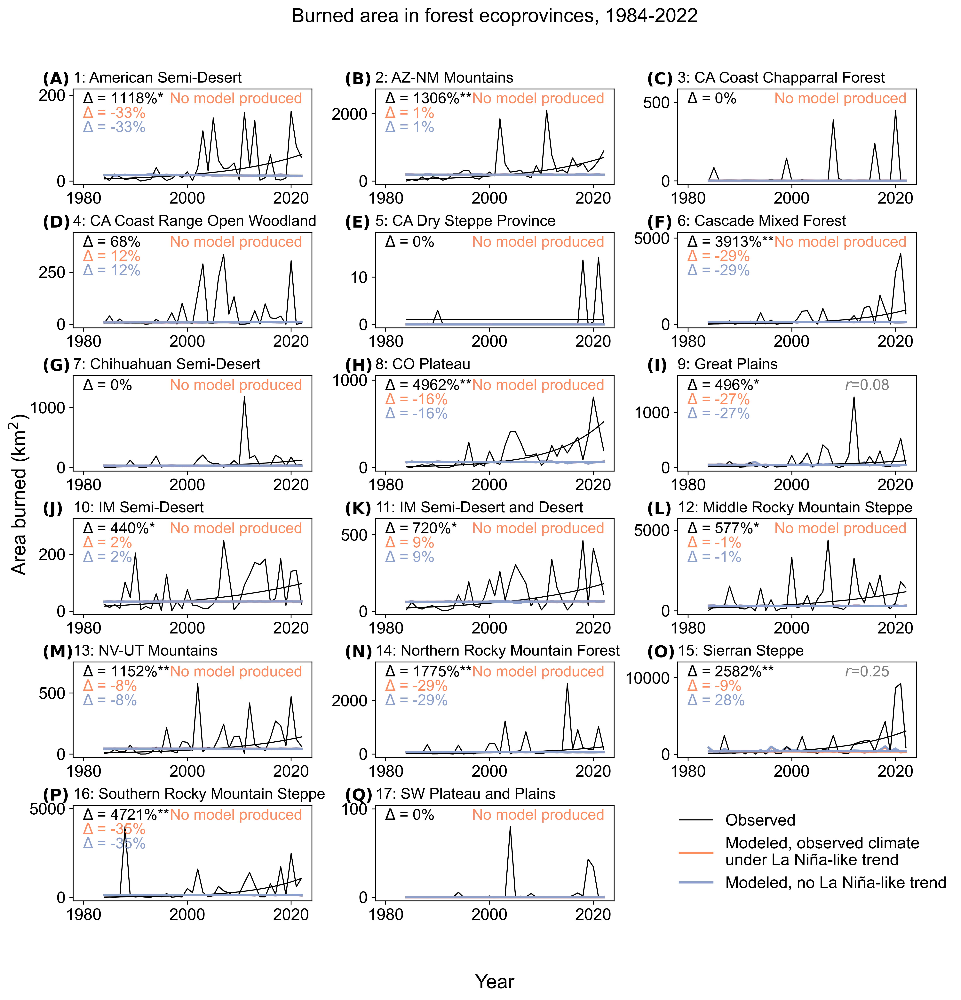

In [56]:
# FOREST create a 4x6 grid for the 17 ecoregions that are available
years = np.arange(firstyear, finalyear+1)
fig, ax = plt.subplots(6,3, figsize=(13,13))
figrow = np.arange(0,6)
figcol = np.arange(0,3)

# these values to manually change (FOREST)
tmpobs = wumifor
tmpmodelpred = BAclimpredfor
tmpmodelpredDT = BAclimpredfor_DT
tmpobstrend = delta_wumifor_ecoprov
tmpmodeltrend = delta_modelfor_ecoprov
tmpmodeltrendDT = delta_modelforDT_ecoprov
tmprmodel = rvalue_climpredfor
tmprmodel_p = rvalue_climpredfor_p
tmpp_obstrend = p_obsfor
tmpp_modeltrend = p_modelfor
tmpp_modelDTtrend = p_modelDTfor

# run the figure
i = 1
for thisrow in figrow:
    for thiscol in figcol:
        if i>=len(dfnames):
            break
        thisname = dfnames[i]
        #print(thisname)
        # select column of ecoregion
        sum_BAclimpred = (10**(tmpmodelpred.loc[:,thisname])) 
        sum_BAclimpred_DT = (10**(tmpmodelpredDT.loc[:,thisname]))
        sumswumi = tmpobs.loc[:,str(dfnum[i-1])]
        sumswumilog = np.ma.masked_invalid(np.log10(sumswumi)).filled(0)
        sums_BAclimpredlog = np.ma.masked_invalid(np.log10(sum_BAclimpred)).filled(0)
        tmpr = tmprmodel[i]
        tmppmarker = addSigMarker(tmprmodel_p[i])
        tmprlabel = '{:.2f}{:}'.format(tmpr, tmppmarker)
        
        # line of best fit
        # wumi lines of best fit
        tmpbestfit = theilslopes(sumswumilog, x=xyears, method='joint') # regression
        tmpm = tmpbestfit.slope
        tmpb = tmpbestfit.intercept
        # BA model lines of best fit
        tmpbestfit = theilslopes(tmpmodelpred.loc[:,thisname],
                                 x=xyears, method='joint') # regression
        tmpmBA = tmpbestfit.slope
        tmpbBA = tmpbestfit.intercept
        # detrended BA model lines of best fit
        tmpbestfit = theilslopes(tmpmodelpredDT.loc[:,thisname],
                                 x=xyears, method='joint') # regression
        tmpmBA_DT = tmpbestfit.slope
        tmpbBA_DT = tmpbestfit.intercept
        
        # plot data
        ax[thisrow,thiscol].plot(sumswumi, label='Observed', 
                                 zorder=2, c='k', linewidth=1)
        ax[thisrow,thiscol].plot(years, sum_BAclimpred, label='From observed SST trend', 
                                 c=colorobs, linewidth=2, zorder=1)
        ax[thisrow,thiscol].plot(years, sum_BAclimpred_DT, label='From detrended SST', 
                                 c=colorDT, linewidth=2, zorder=1)
        # plot line of best fit
        ax[thisrow,thiscol].plot(xyears, 10**(tmpm*xyears+tmpb),
                   linewidth=1, c='k', zorder=3)
        ax[thisrow,thiscol].plot(xyears, 10**(tmpmBA*xyears+tmpbBA), 
                   linewidth=2, c=colorobs, zorder=4)
        ax[thisrow,thiscol].plot(xyears, 10**(tmpmBA_DT*xyears+tmpbBA_DT), 
                   linewidth=2, c=colorDT, zorder=5)

        # set decorations
        ax[thisrow,thiscol].set_box_aspect(0.4)
        tmpmax_val = np.array([sumswumi]+[sum_BAclimpred]).max()
        tmprounded_max = np.ceil(tmpmax_val / 5) * 5 
        current_min = ax[thisrow,thiscol].get_ylim()[0]
        ax[thisrow,thiscol].set_xlim([1978,finalyear+2])
        ax[thisrow,thiscol].set_ylim([current_min,tmprounded_max*1.3])
        
        # set title
        ax[thisrow,thiscol].set_title(prov_label_names[i-1], loc='left',fontsize=14)
        #ax[thisrow,thiscol].annotate(prov_label_names[i-1],(0.06,0.85), c='#000', xycoords='axes fraction' )
        
        # print the r value, or else
        # no model produced for these ecoprovinces
        if i in [1,2,3,4,5,6,7,8,10,11,12,13,14,16,17]:
            ax[thisrow,thiscol].annotate('No model produced',(0.96,0.85),
                                         ha='right', c=colorobs, 
                                         xycoords='axes fraction', fontsize=14)
        else:
            ax[thisrow,thiscol].annotate("$r$="+tmprlabel, (0.70,0.85), 
                c='gray', xycoords='axes fraction',fontsize=14)
        
        # change annotations if model is NaN or not
        if np.isnan(tmpobstrend[i-1]):
            ax[thisrow,thiscol].annotate('$\Delta$ = 0%', (0.04,0.85), 
                c='k', xycoords='axes fraction',fontsize=14)
            #ax[thisrow,thiscol].annotate('from gSST = \n0 ppts, 0%',
            #    (0.04,0.45), c='k', xycoords='axes fraction' )
        else:
            tmppmarker = addSigMarker(tmpp_obstrend[i])
            ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f}%{:}'.format(tmpobstrend[i-1],tmppmarker),
                    (0.04,0.85), c='k', xycoords='axes fraction', fontsize=14)
            tmppmarker = addSigMarker(tmpp_modeltrend[i])
            ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f}%{:}'.format(tmpmodeltrend[i-1],tmppmarker),
                    (0.04,0.70), c=colorobs, xycoords='axes fraction', fontsize=14 )
            tmppmarker = addSigMarker(tmpp_modelDTtrend[i])
            ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f}%{:}'.format(tmpmodeltrendDT[i-1], tmppmarker),
                    (0.04,0.55), c=colorDT, xycoords='axes fraction', fontsize=14 )
            tmppptsdiff = tmpmodeltrend[i-1]-tmpmodeltrendDT[i-1]
            tmppct = (tmppptsdiff)/(tmpobstrend[i-1])*100
            #ax[thisrow,thiscol].annotate('from gSST = \n{:.0f} ppts, {:.0f}%'.format(tmppptsdiff, tmppct),
            #     (0.04,0.45), c='k', xycoords='axes fraction' )
        #ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f} ppts'.format(tmpmodeltrend[i-1]),
        #                             (0.04,0.65), c=colorobs, xycoords='axes fraction' )
        #ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f} ppts'.format(tmpmodeltrendDT[i-1]), (0.04,0.54), 
        #        c=colorDT, xycoords='axes fraction' )
        
        
        i+=1
fig.supylabel('Area burned (km$^2$)')
fig.supxlabel('Year')
fig.suptitle('Burned area in forest ecoprovinces, '+str(firstyear)+'-'+str(finalyear))
fig.delaxes(ax[5,2])
fig.legend(['Observed',
           'Modeled, observed climate \nunder La Niña-like trend',
           'Modeled, no La Niña-like trend'],
           frameon=False, bbox_to_anchor=(0.96,0.20))

k=0
figlabels = [chr(i) for i in range(65, 65 + len(dfnum)+1)]


# add figure labels
for thisrow in figrow:
    for thiscol in figcol:
        thisfiglabel = figlabels[k]
        ax[thisrow,thiscol].annotate('$\\bf{(%s)}$' % thisfiglabel, (-0.13,1.05), 
                                     c='k', xycoords='axes fraction')
        k+=1

fig.patch.set_alpha(0)
plt.subplots_adjust(wspace=0.22, hspace=0.5, left=0.08, right=0.92, top=0.9, bottom=0.1)

plt.savefig(figfolder + 'exp-priorwettingonly_Ecoprovince_BurnedArea_Forest.png')

# Figure 6: All nonforest ecoprovinces

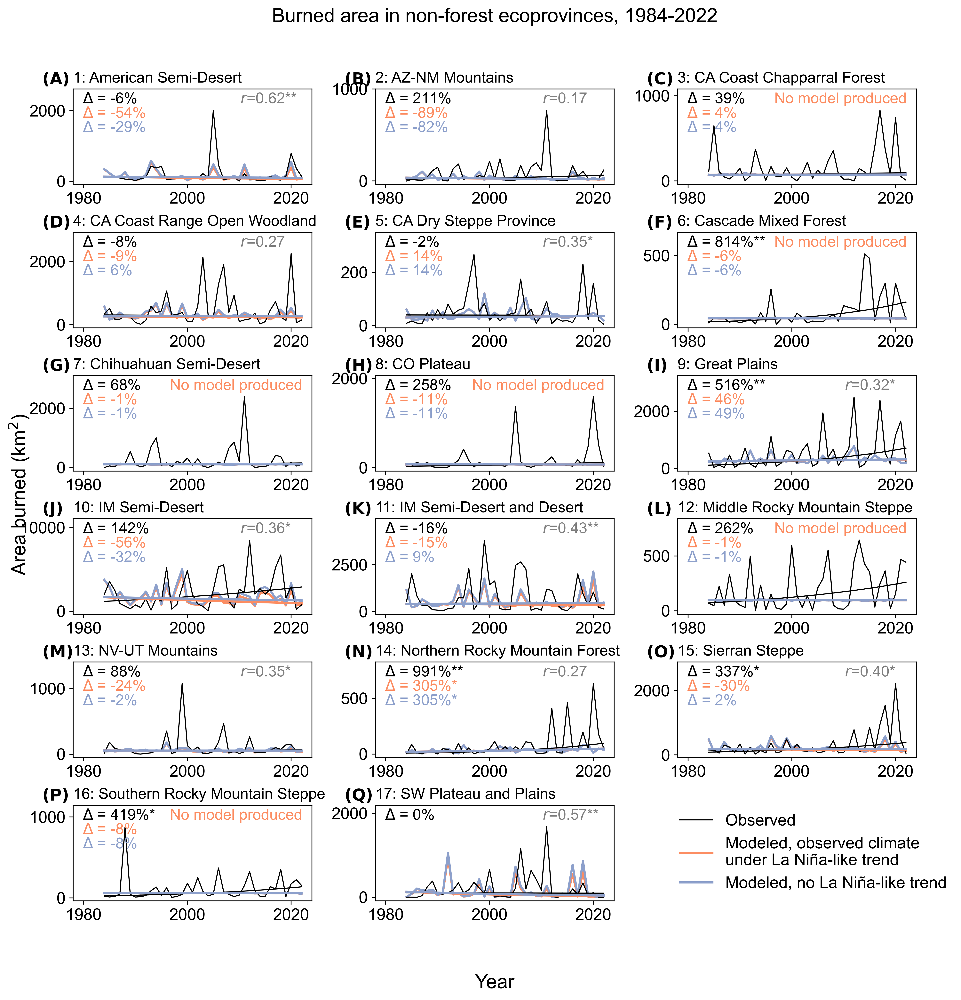

In [57]:
# NONFOREST create a 4x6 grid for the 17 ecoregions that are available
years = np.arange(firstyear, finalyear+1)
fig, ax = plt.subplots(6,3, figsize=(13,13))
figrow = np.arange(0,6)
figcol = np.arange(0,3)

# these values to manually change (NON-FOREST)
tmpobs = wuminon
tmpmodelpred = BAclimprednon
tmpmodelpredDT = BAclimprednon_DT
tmpobstrend = delta_wuminon_ecoprov
tmpmodeltrend = delta_modelnon_ecoprov
tmpmodeltrendDT = delta_modelnonDT_ecoprov
tmprmodel = rvalue_climprednon
tmprmodel_p = rvalue_climprednon_p
tmpp_obstrend = p_obsnon
tmpp_modeltrend = p_modelnon
tmpp_modelDTtrend = p_modelDTnon

# run the figure
i = 1
for thisrow in figrow:
    for thiscol in figcol:
        if i>=len(dfnames):
            break
        thisname = dfnames[i]
        #print(thisname)
        # select column of ecoregion
        sum_BAclimpred = (10**(tmpmodelpred.loc[:,thisname])) 
        sum_BAclimpred_DT = (10**(tmpmodelpredDT.loc[:,thisname]))
        sumswumi = tmpobs.loc[:,str(dfnum[i-1])]
        sumswumilog = np.ma.masked_invalid(np.log10(sumswumi)).filled(0)
        sums_BAclimpredlog = np.ma.masked_invalid(np.log10(sum_BAclimpred)).filled(0)
        tmpr = tmprmodel[i]
        tmppmarker = addSigMarker(tmprmodel_p[i])
        tmprlabel = '{:.2f}{:}'.format(tmpr, tmppmarker)
        
        # line of best fit
        # wumi lines of best fit
        tmpbestfit = theilslopes(sumswumilog, x=xyears, method='joint') # regression
        tmpm = tmpbestfit.slope
        tmpb = tmpbestfit.intercept
        # BA model lines of best fit
        tmpbestfit = theilslopes(tmpmodelpred.loc[:,thisname],
                                 x=xyears, method='joint') # regression
        tmpmBA = tmpbestfit.slope
        tmpbBA = tmpbestfit.intercept
        # detrended BA model lines of best fit
        tmpbestfit = theilslopes(tmpmodelpredDT.loc[:,thisname],
                                 x=xyears, method='joint') # regression
        tmpmBA_DT = tmpbestfit.slope
        tmpbBA_DT = tmpbestfit.intercept
        
        # plot data
        ax[thisrow,thiscol].plot(sumswumi, label='Observed', 
                                 zorder=2, c='k', linewidth=1)
        ax[thisrow,thiscol].plot(years, sum_BAclimpred, label='From observed SST trend', 
                                 c=colorobs, linewidth=2, zorder=1)
        ax[thisrow,thiscol].plot(years, sum_BAclimpred_DT, label='From detrended SST', 
                                 c=colorDT, linewidth=2, zorder=1)
        # plot line of best fit
        ax[thisrow,thiscol].plot(xyears, 10**(tmpm*xyears+tmpb),
                   linewidth=1, c='k', zorder=3)
        ax[thisrow,thiscol].plot(xyears, 10**(tmpmBA*xyears+tmpbBA), 
                   linewidth=2, c=colorobs, zorder=4)
        ax[thisrow,thiscol].plot(xyears, 10**(tmpmBA_DT*xyears+tmpbBA_DT), 
                   linewidth=2, c=colorDT, zorder=5)

        # set decorations
        ax[thisrow,thiscol].set_box_aspect(0.4)
        tmpmax_val = np.array([sumswumi]+[sum_BAclimpred]).max()
        tmprounded_max = np.ceil(tmpmax_val / 5) * 5 
        current_min = ax[thisrow,thiscol].get_ylim()[0]
        ax[thisrow,thiscol].set_xlim([1978,finalyear+2])
        ax[thisrow,thiscol].set_ylim([current_min,tmprounded_max*1.3])
        
        # set title
        ax[thisrow,thiscol].set_title(prov_label_names[i-1], loc='left',fontsize=14)
        #ax[thisrow,thiscol].annotate(prov_label_names[i-1],(0.06,0.85), c='#000', xycoords='axes fraction' )
        
        if i in [3,6,7,8,12,16]:
            ax[thisrow,thiscol].annotate('No model produced',(0.96,0.85),
                                         ha='right', c=colorobs, 
                                         xycoords='axes fraction', fontsize=14)
        else:
            # print the r value
            ax[thisrow,thiscol].annotate("$r$="+tmprlabel, (0.70,0.85), 
                c='gray', xycoords='axes fraction',fontsize=14)
        
        # change annotations if model is NaN or not
        if np.isnan(tmpobstrend[i-1]):
            ax[thisrow,thiscol].annotate('$\Delta$ = 0%', (0.04,0.85), 
                c='k', xycoords='axes fraction',fontsize=14)
            #ax[thisrow,thiscol].annotate('from gSST = \n0 ppts, 0%',
            #    (0.04,0.45), c='k', xycoords='axes fraction' )
        else:
            tmppmarker = addSigMarker(tmpp_obstrend[i])
            ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f}%{:}'.format(tmpobstrend[i-1],tmppmarker),
                    (0.04,0.85), c='k', xycoords='axes fraction', fontsize=14)
            tmppmarker = addSigMarker(tmpp_modeltrend[i])
            ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f}%{:}'.format(tmpmodeltrend[i-1],tmppmarker),
                    (0.04,0.70), c=colorobs, xycoords='axes fraction', fontsize=14 )
            tmppmarker = addSigMarker(tmpp_modelDTtrend[i])
            ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f}%{:}'.format(tmpmodeltrendDT[i-1], tmppmarker),
                    (0.04,0.55), c=colorDT, xycoords='axes fraction', fontsize=14 )
            tmppptsdiff = tmpmodeltrend[i-1]-tmpmodeltrendDT[i-1]
            tmppct = (tmppptsdiff)/(tmpobstrend[i-1])*100
            #ax[thisrow,thiscol].annotate('from gSST = \n{:.0f} ppts, {:.0f}%'.format(tmppptsdiff, tmppct),
            #     (0.04,0.45), c='k', xycoords='axes fraction' )
        #ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f} ppts'.format(tmpmodeltrend[i-1]),
        #                             (0.04,0.65), c=colorobs, xycoords='axes fraction' )
        #ax[thisrow,thiscol].annotate('$\Delta$ = {:.0f} ppts'.format(tmpmodeltrendDT[i-1]), (0.04,0.54), 
        #        c=colorDT, xycoords='axes fraction' )
        i+=1
fig.supylabel('Area burned (km$^2$)')
fig.supxlabel('Year')
fig.suptitle('Burned area in non-forest ecoprovinces, '+str(firstyear)+'-'+str(finalyear))
fig.delaxes(ax[5,2])
fig.legend(['Observed',
           'Modeled, observed climate \nunder La Niña-like trend',
           'Modeled, no La Niña-like trend'],
           frameon=False, bbox_to_anchor=(0.96,0.20))

k=0
figlabels = [chr(i) for i in range(65, 65 + len(dfnum)+1)]

#fig.tight_layout()

# add figure labels
for thisrow in figrow:
    for thiscol in figcol:
        thisfiglabel = figlabels[k]
        ax[thisrow,thiscol].annotate('$\\bf{(%s)}$' % thisfiglabel, (-0.13,1.05), 
                                     c='k', xycoords='axes fraction')
        k+=1

fig.patch.set_alpha(0)
plt.subplots_adjust(wspace=0.22, hspace=0.5, left=0.08, right=0.92, top=0.9, bottom=0.1)

plt.savefig(figfolder + 'exp-priorwettingonly_Ecoprovince_BurnedArea_Nonforest.png')

In [58]:
# datetime object containing current date and time
from datetime import datetime
now = datetime.now()
# dd/mm/YY H:M:S
dt_string = now.strftime("%d/%m/%Y %H:%M:%S")
print("Analysis last run =", dt_string)

Analysis last run = 21/02/2025 15:45:54
